In [2]:
import numpy as np
import pandas as pd
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from astropy.time import Time
from astropy.coordinates import solar_system_ephemeris, EarthLocation
from astropy.coordinates import get_body_barycentric, get_body, get_moon

In [3]:
#TEAM VNS HELPERS https://github.com/ArnaudFickinger/astronomical_dataset_generator


def reset_time(Time,cycle):
    New_time = Time - Time.min(axis = 0)
    mod_time = New_time % cycle
    return mod_time
    
def scale(X,max_val):
    n = len(X)
    X_std = (np.array([((X[i] - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))) for i in range(0,n)]))*max_val 
    return X_std
    

In [4]:
#FOURIER FUNCTIONS

#please pass one series at a time, i have made the function for a whole matrix yet

def convert_cartesian(ra, decl, dist):
    x = dist * np.cos(ra) * np.cos(decl)
    y = dist * np.sin(ra) * np.cos(decl)
    z = dist * np.sin(decl)
    return x.to_numpy(), y.to_numpy(), z.to_numpy()

def plot_spectrum(X):
    n = X.shape[0]
    
    fft_data = np.fft.fft(X,axis=0)
    ps = abs(fft_data[0:(int(n/2))])**2/n

    freqs = np.array(list(range(0,int(n/2) )))
    idx = np.argsort(freqs)
    
  
    fig, ax = plt.subplots()
    ax.stem(freqs[1:100], ps[1:100], markerfmt=' ')
    plt.show()

#please pass one series at a time, i have made the function for a whole matrix yet
#This function works well on decomposing ascention and declenation into frequencies and then forecasting with these frequencies
#Additionally, it will allow you to pass in a hyperparameter specifying K top frequencies to use for prediction (k is max n/2).
#This function will plot the ascention or declenation if you want as well

def fourier_forecast(X,length,top_k= None,plot = False): 
    #transform the data
    
    #if top_k isnt specified set to full set of frequencies in the data
    if top_k == None:
        top_k = int((X.shape[0]-1)/2)
    
    dft = np.fft.fft(X,axis=0)[1:]
    n = X.shape[0]
    training_mean = np.mean(X)
    pred = np.array(np.zeros((length)),dtype = complex) 
    
    
    #find top k frequencies
    ps = abs(dft[0:int(n/2)])**2/n
    sorted_fourier = np.sort(ps.flatten())[::-1]
    top_fourier = sorted_fourier[:top_k]
    
    #grab the index of the strongest frequencies
    freqs = [list(ps).index(i) for i in list(top_fourier)]
    fourier = dft[freqs]
    d = fourier.shape[0]
    
    
    
    #loop through the predictions, making sure we keep the frequencies consistent
    #we need to look through the indexes as well, need to multiply by two to take into account the symmetry of the spectrum
    for t in range(0,length):
        pred[t] = sum(np.array([2*fourier[k] * np.exp(2*np.pi/n*(freqs[k]+1)*(t)*1j) for k in range(0,d)]))
        pred[t] = pred[t]/n
        
       # percentile = length/10 
       # if t % percentile == 0:
       #     print(int(t/length*100),'%')
    
    pred = (pred).real + training_mean
    
    #plotting
    if plot == True:
        if n == length:
            plt.plot(X)
            plt.plot(pred)
        elif n > length:
            diff = n - length 
            pred_new = np.append(np.array(pred) , np.array([training_mean]*diff)) 
            plt.plot(X)
            plt.plot(pred_new)
        elif n < length:
            diff = length - n
            X_new = np.append(np.array(X),np.array([training_mean]*diff))
            plt.plot(X_new)
            plt.plot(pred)
    plt.show()
   
    return pred


Load data

In [3]:
venus = pd.read_csv("../../Data/Venus2x.csv")
mars = pd.read_csv("../../Data/Mars2x.csv")
mercury = pd.read_csv("../../Data/Mercury2x.csv")
saturn = pd.read_csv("../../Data/Saturn2x.csv")
jupiter = pd.read_csv("../../Data/Jupiter2x.csv")
Neptune = pd.read_csv("../../Data/Neptune2x.csv")
Pluto = pd.read_csv("../../Data/Pluto2x.csv")
Uranus = pd.read_csv("../../Data/Uranus2x.csv")


The next code chuncks are CV on the best number of frequencies.  We train on one full cycle and then predict on the next cycle to see how our learned functino performs on the test data

Venus

Top  1  Frequencies


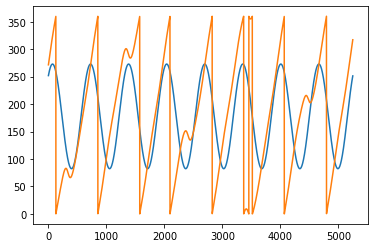

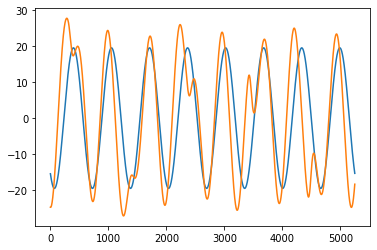

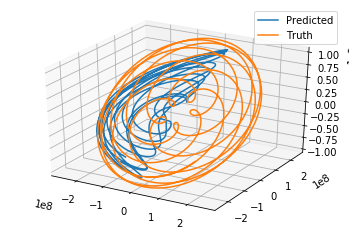

Top  5  Frequencies


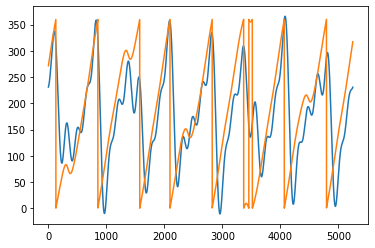

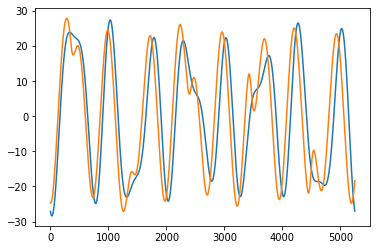

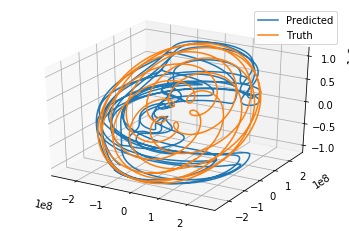

Top  10  Frequencies


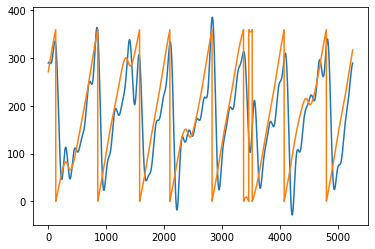

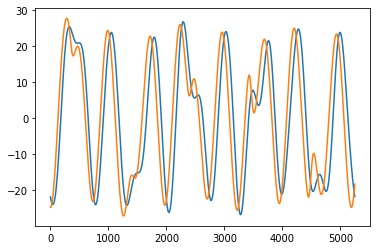

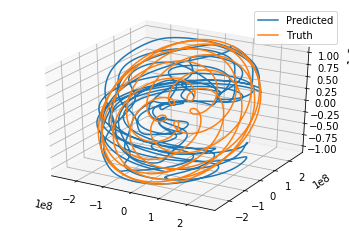

Top  15  Frequencies


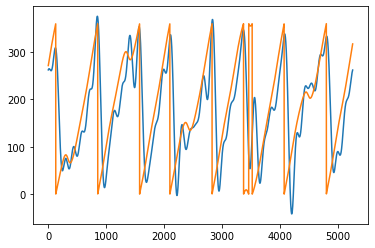

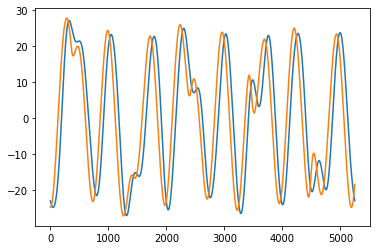

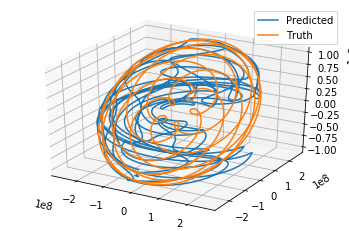

Top  20  Frequencies


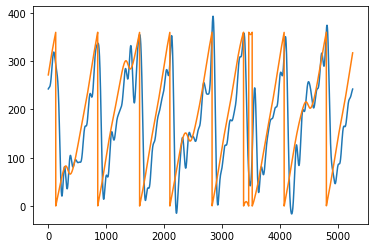

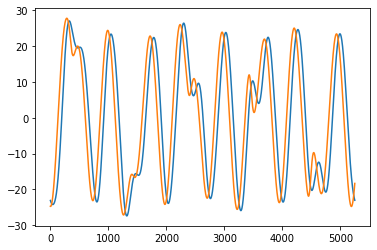

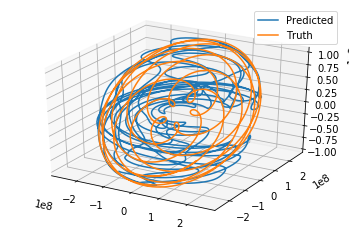

Top  30  Frequencies


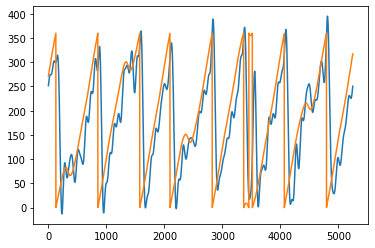

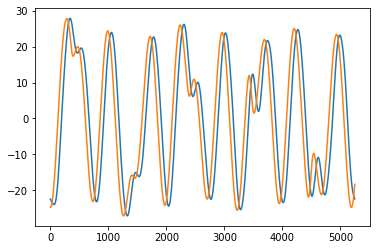

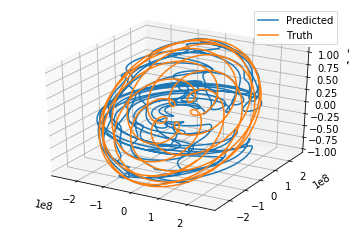

Top  40  Frequencies


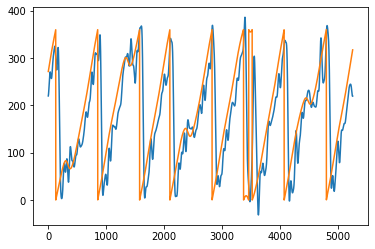

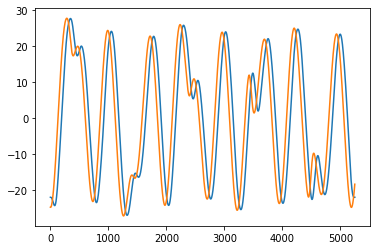

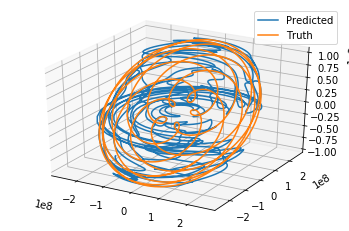

Top  50  Frequencies


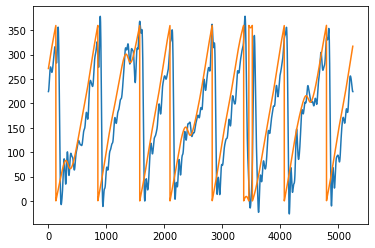

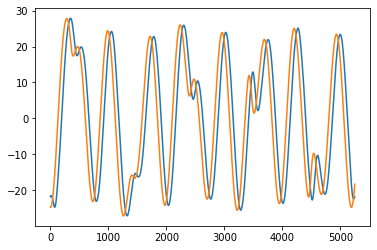

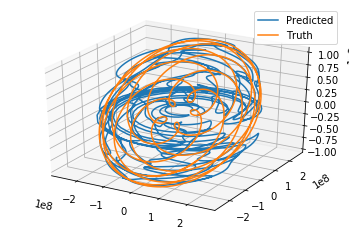

Top  75  Frequencies


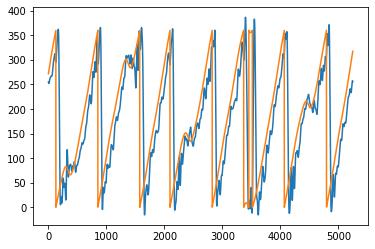

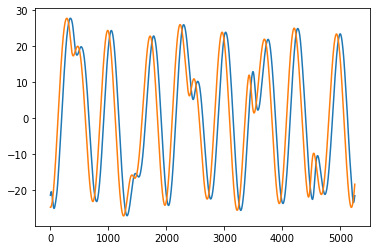

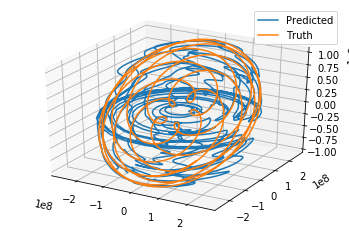

Top  100  Frequencies


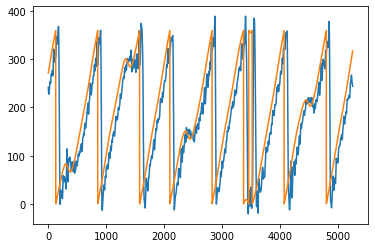

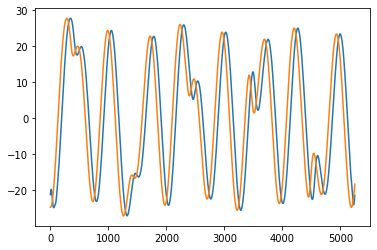

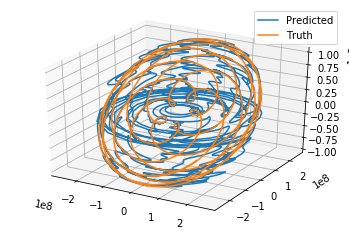

Top  300  Frequencies


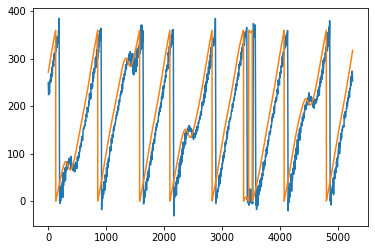

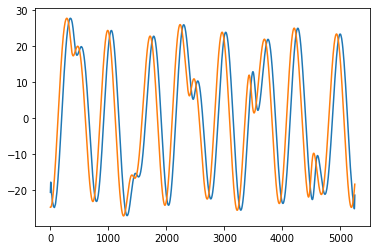

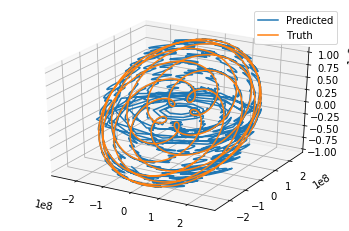

Top  1000  Frequencies


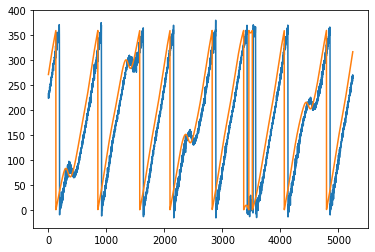

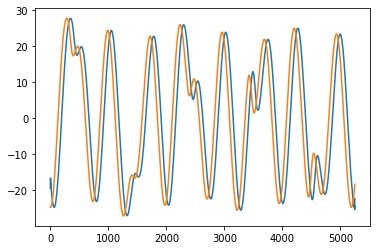

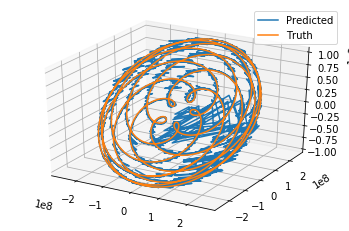

Top  5250  Frequencies


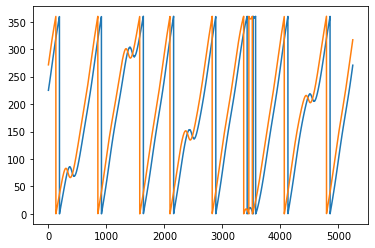

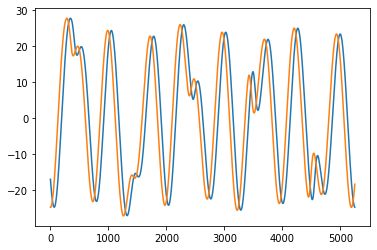

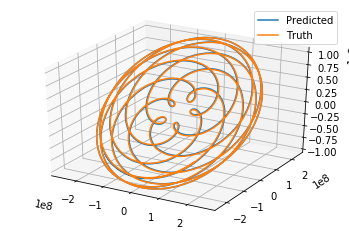

NameError: name 'MSE_caresian' is not defined

In [26]:
length = venus.shape[0]
asc_dec = np.asmatrix(venus[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(venus[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]


MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = venus['Distance'][:(int(length/2))]
    venus_test = venus['Distance'][(int(length/2)):]
    venus_asc = venus['Right Ascension'][(int(length/2)):]
    venus_dec = venus['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(venus_asc), np.radians(venus_dec), venus_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print(MSE_cartesian)
print(MSE)
one_norm

In [27]:
print(MSE_cartesian)

[1.67162408e+08 1.49183614e+08 1.44371514e+08 1.42557076e+08
 1.39696492e+08 1.38018859e+08 1.36290030e+08 1.34497155e+08
 1.29028421e+08 1.27718945e+08 1.25119833e+08 1.24177626e+08
 1.23865592e+08]


Mars

Top  1  Frequencies


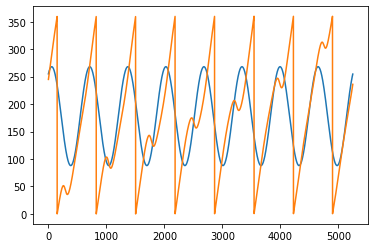

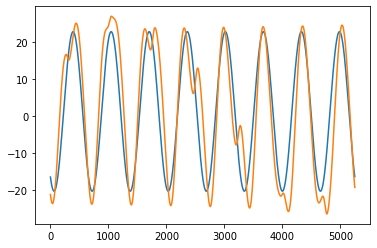

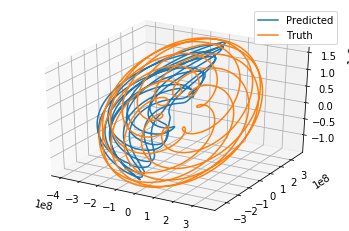

Top  5  Frequencies


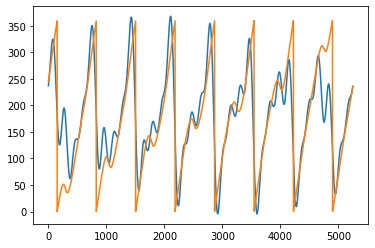

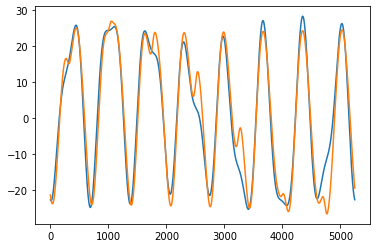

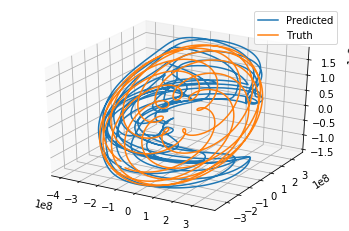

Top  10  Frequencies


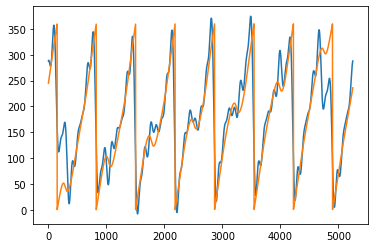

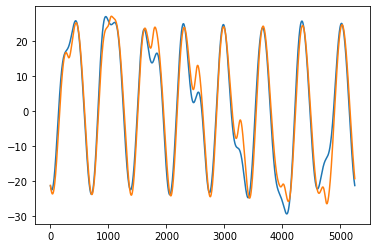

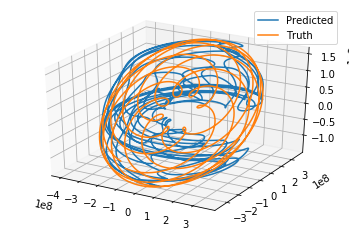

Top  15  Frequencies


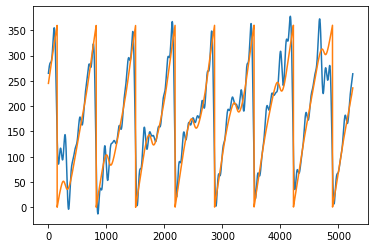

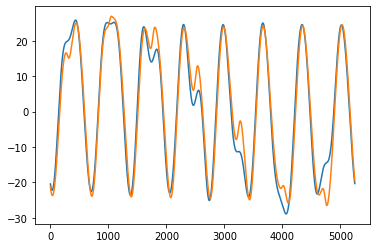

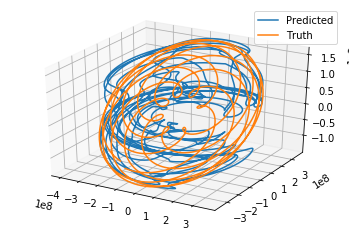

Top  20  Frequencies


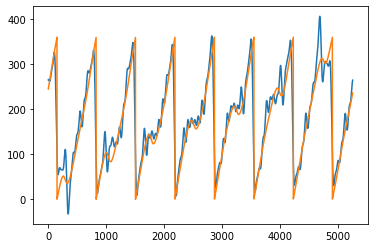

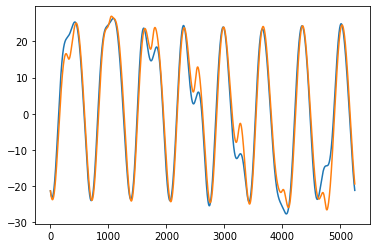

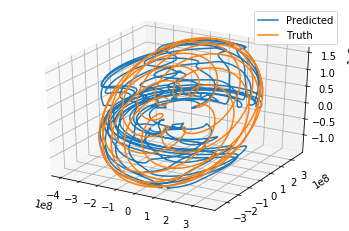

Top  30  Frequencies


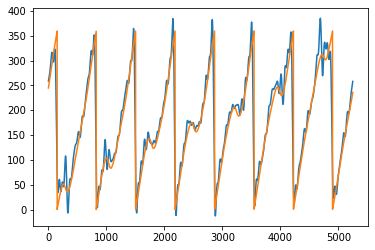

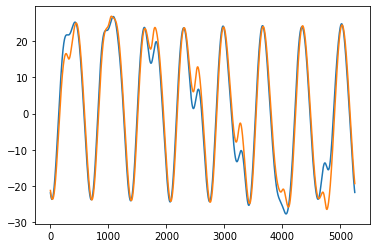

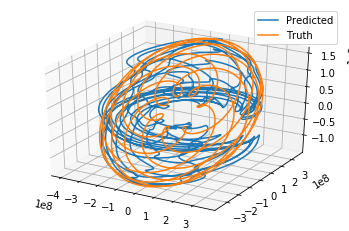

Top  40  Frequencies


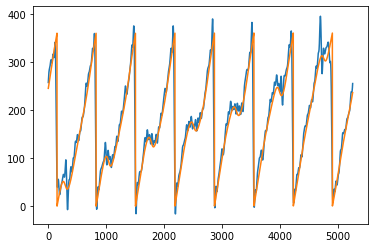

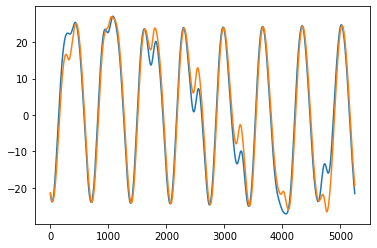

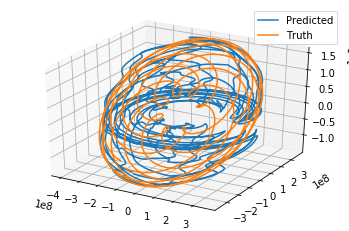

Top  50  Frequencies


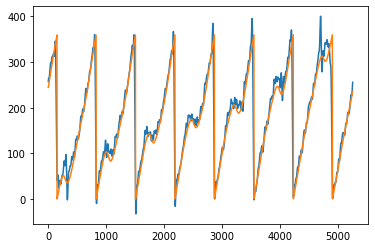

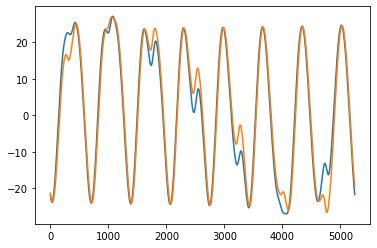

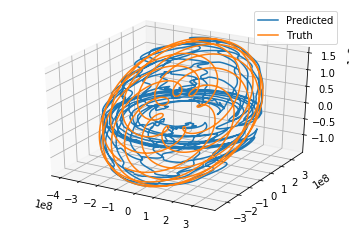

Top  75  Frequencies


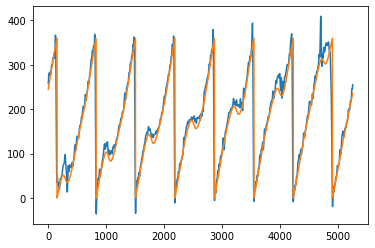

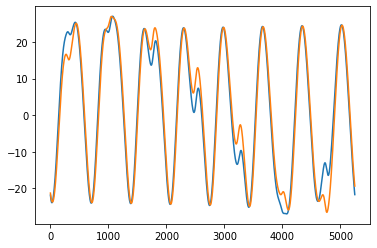

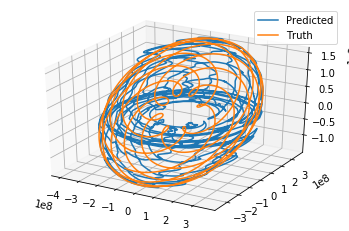

Top  100  Frequencies


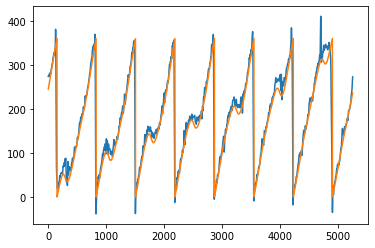

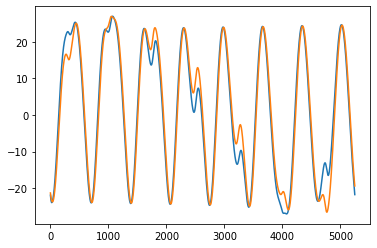

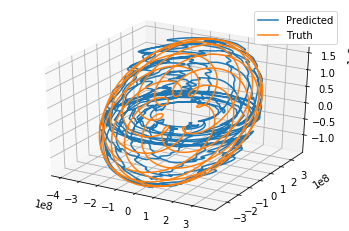

Top  300  Frequencies


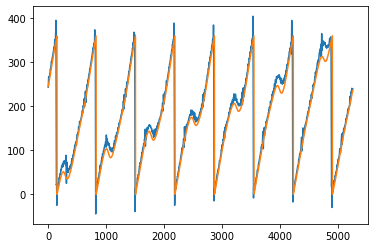

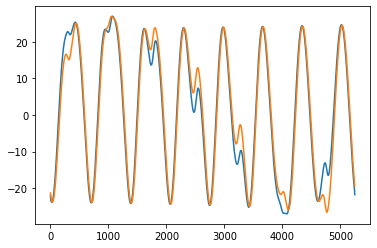

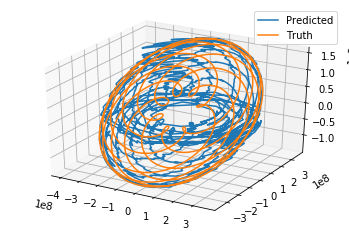

Top  1000  Frequencies


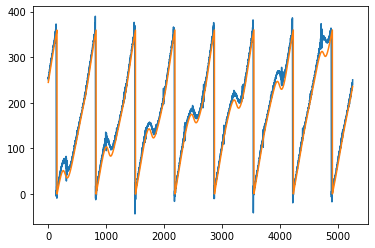

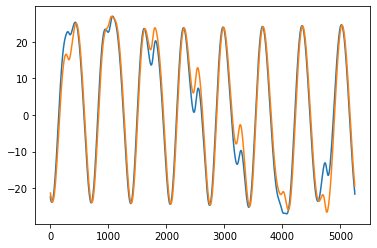

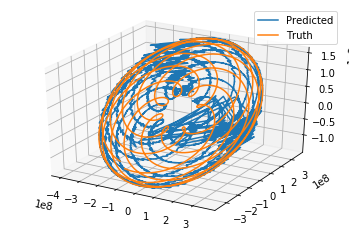

Top  5250  Frequencies


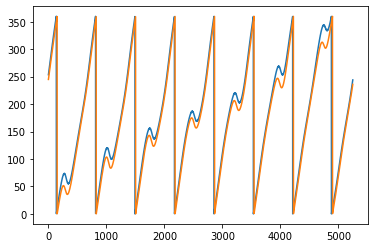

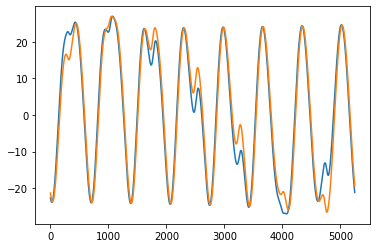

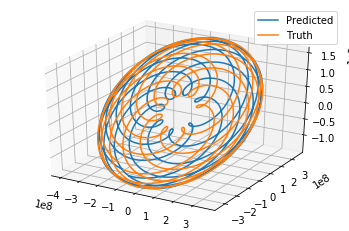

[1.94056409e+08 1.23188875e+08 1.01444356e+08 9.48795246e+07
 9.09045719e+07 7.46731423e+07 6.90164884e+07 6.15062852e+07
 5.61953085e+07 5.42071523e+07 4.79650167e+07 4.47824051e+07
 4.26890668e+07]
[55.0894298  36.13236502 29.91270635 27.02142413 24.78879657 20.65874606
 19.77096436 19.23192758 18.69329677 18.56225093 18.0955003  17.87115009
 17.68232659]


array([54.31217239, 35.73512796, 29.5744325 , 26.64343047, 24.43415926,
       20.25429582, 19.34886096, 18.80332195, 18.24251266, 18.11754711,
       17.62325576, 17.39400062, 17.21727015])

In [22]:
length = mars.shape[0]
asc_dec = np.asmatrix(mars[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(mars[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))
for i in range(0,len(k)):
    
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = mars['Distance'][:(int(length/2))]
    mars_test = mars['Distance'][(int(length/2)):]
    mars_asc = mars['Right Ascension'][(int(length/2)):]
    mars_dec = mars['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(mars_asc), np.radians(mars_dec), mars_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))
    
print(MSE_cartesian)
print(MSE)
one_norm

In [ ]:
Mercury

Top  1  Frequencies


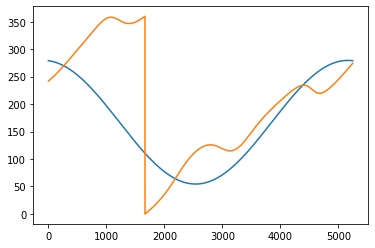

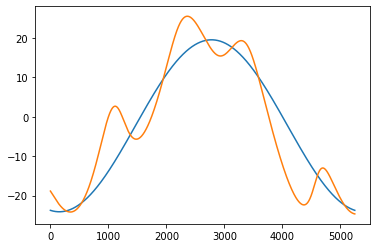

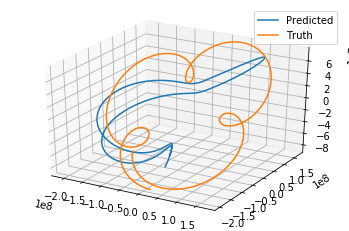

Top  5  Frequencies


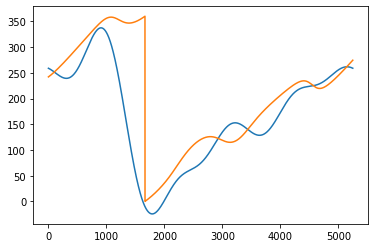

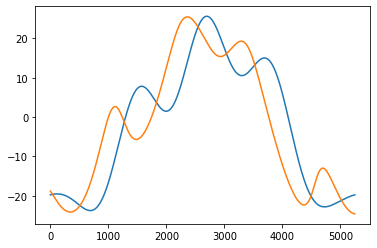

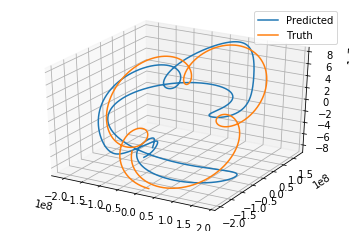

Top  10  Frequencies


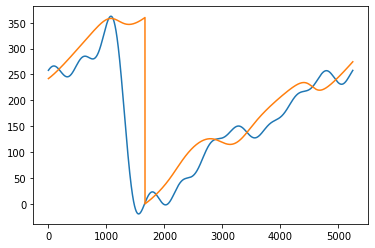

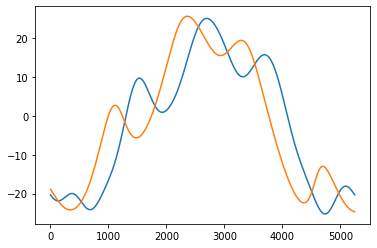

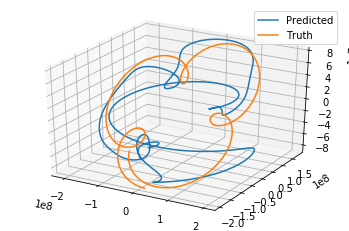

Top  15  Frequencies


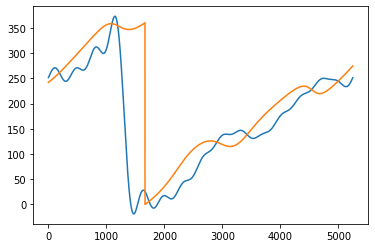

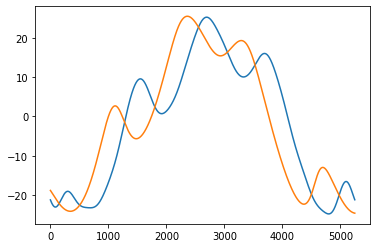

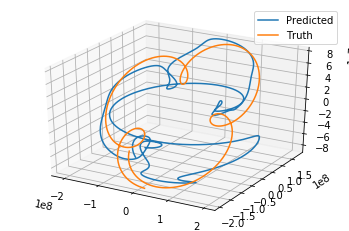

Top  20  Frequencies


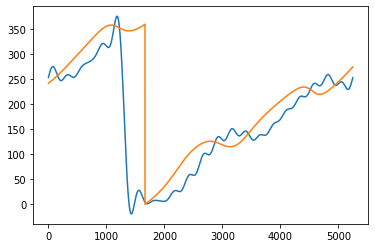

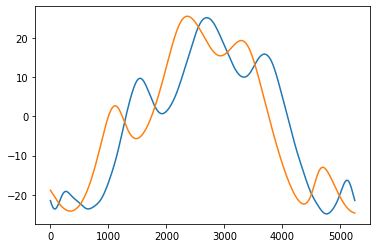

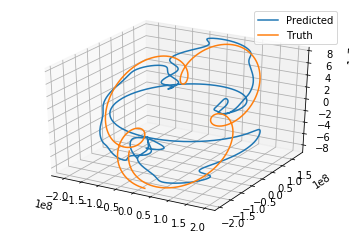

Top  30  Frequencies


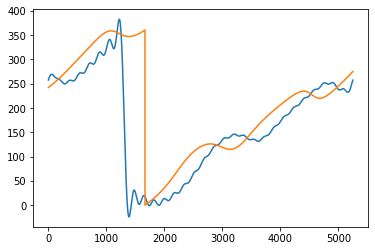

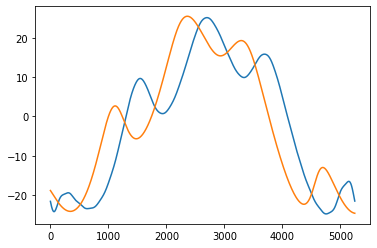

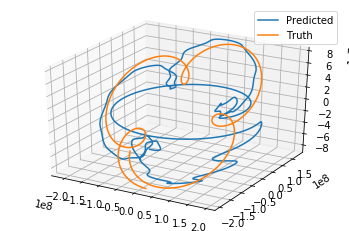

Top  40  Frequencies


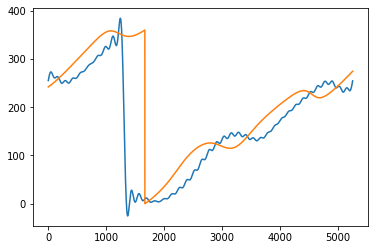

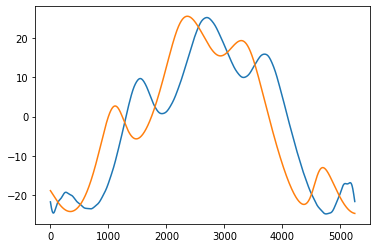

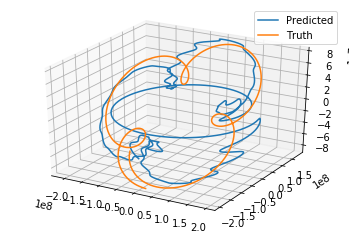

Top  50  Frequencies


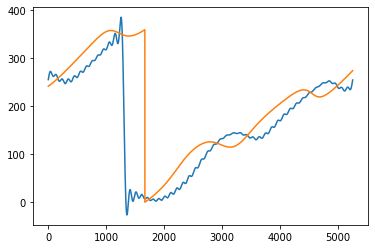

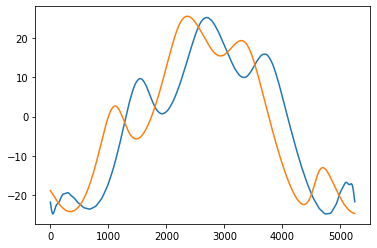

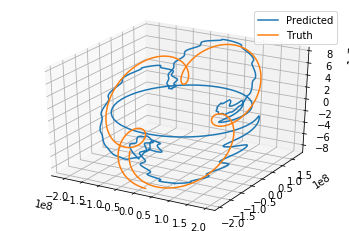

Top  75  Frequencies


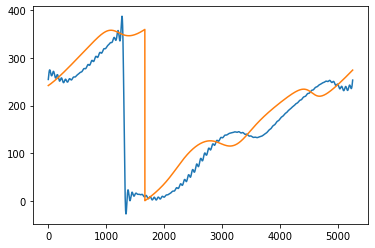

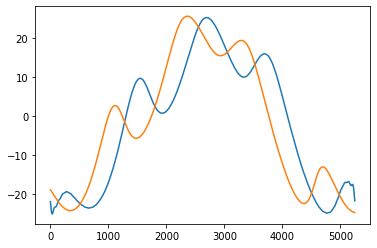

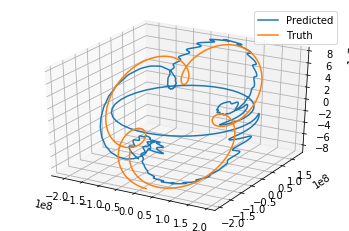

Top  100  Frequencies


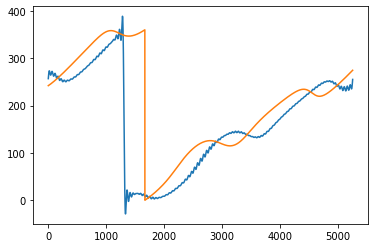

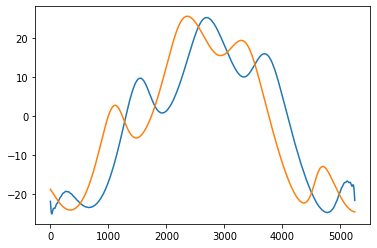

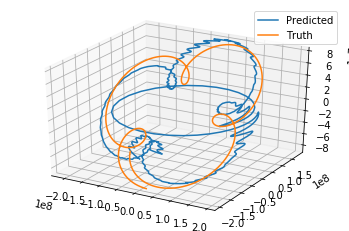

Top  300  Frequencies


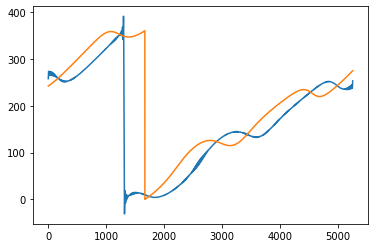

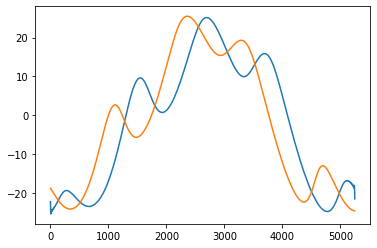

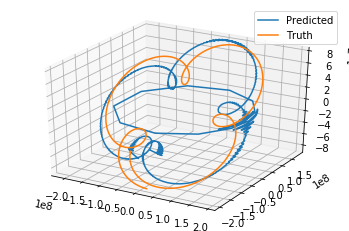

Top  1000  Frequencies


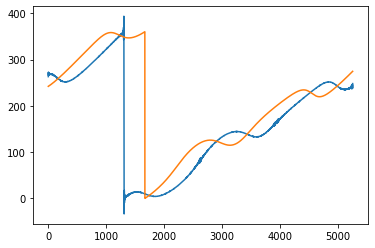

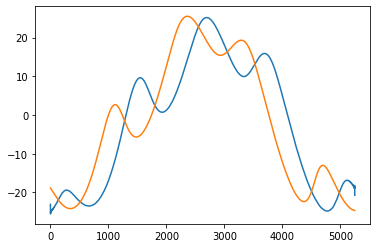

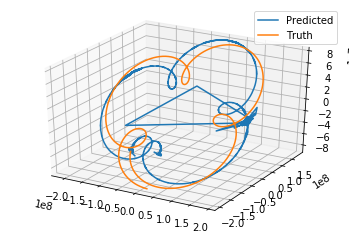

Top  5250  Frequencies


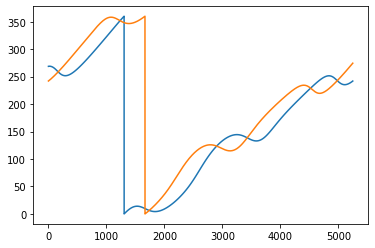

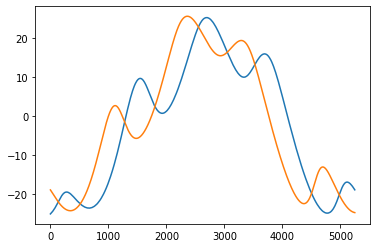

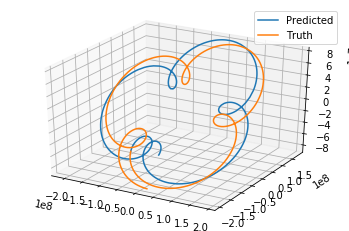

[1.41449155e+08 1.06222912e+08 1.04434855e+08 1.02934159e+08
 1.02321708e+08 1.01213779e+08 1.00791846e+08 1.00464336e+08
 1.00061256e+08 9.98389985e+07 9.93773812e+07 9.92153985e+07
 9.91439374e+07]
[62.19723639 47.33307794 48.87718311 48.85095249 48.68053572 48.54224452
 48.57513197 48.51711924 48.45002563 48.3817105  48.28011097 48.25812234
 48.24987205]


array([61.62691457, 45.87765788, 47.63100112, 47.47652653, 47.29931893,
       47.15118046, 47.14542857, 47.12851873, 47.04548069, 46.97714314,
       46.86979956, 46.84697741, 46.83914751])

In [25]:
length = mercury.shape[0]
asc_dec = np.asmatrix(mercury[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(mercury[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = mercury['Distance'][:(int(length/2))]
    dist_test = mercury['Distance'][(int(length/2)):]
    test_asc = mercury['Right Ascension'][(int(length/2)):]
    test_dec = mercury['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print(MSE_cartesian)
print(MSE)
one_norm

Saturn

Top  1  Frequencies


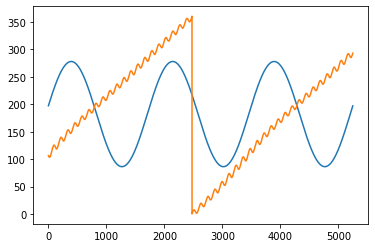

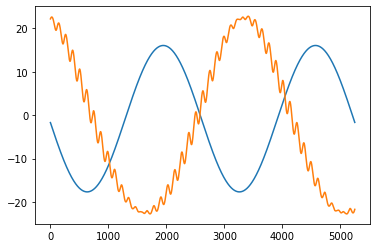

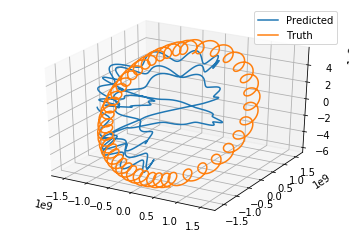

Top  5  Frequencies


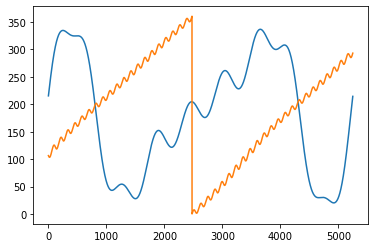

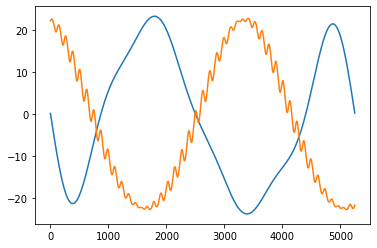

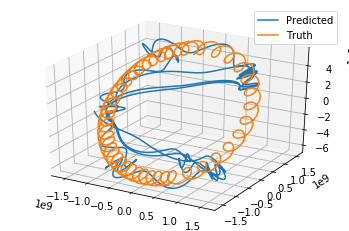

Top  10  Frequencies


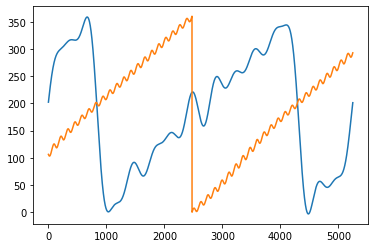

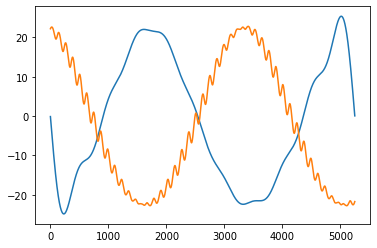

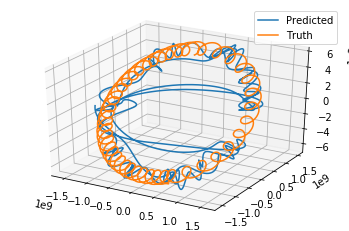

Top  15  Frequencies


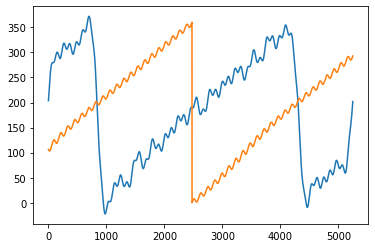

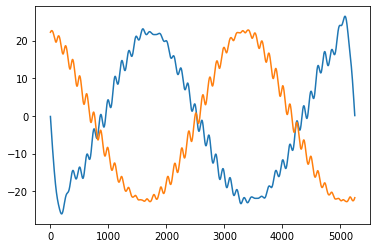

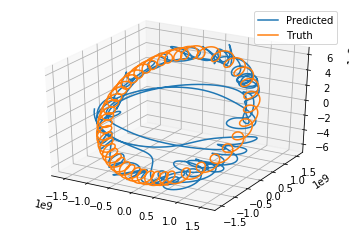

Top  20  Frequencies


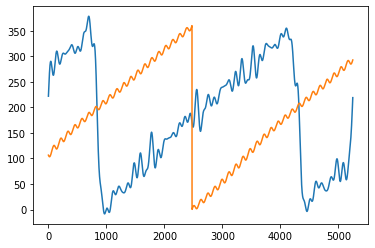

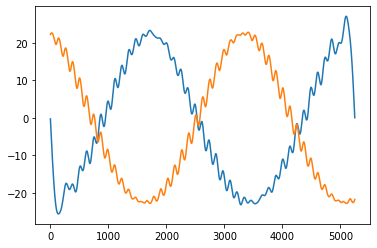

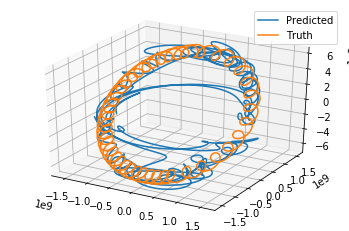

Top  30  Frequencies


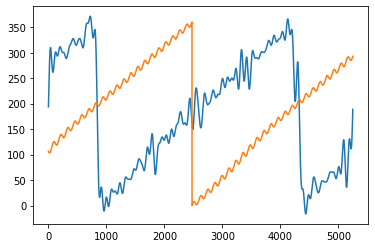

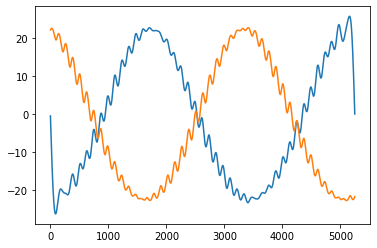

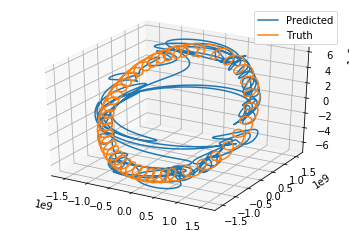

Top  40  Frequencies


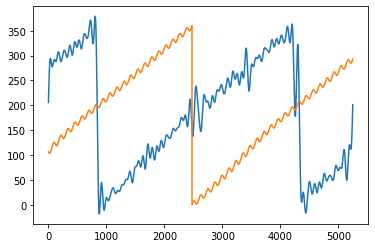

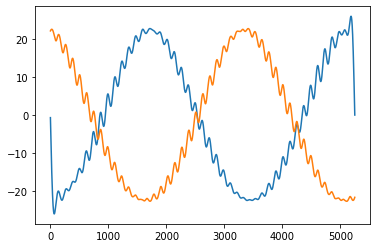

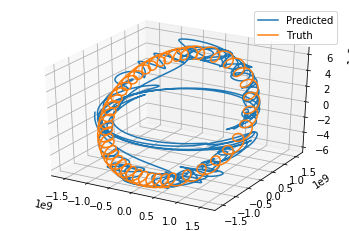

Top  50  Frequencies


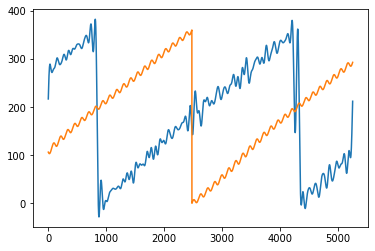

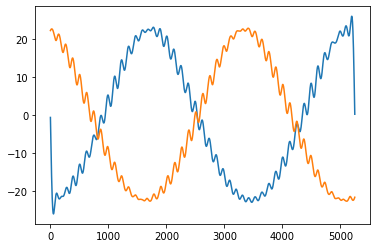

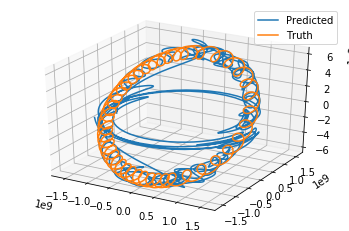

Top  75  Frequencies


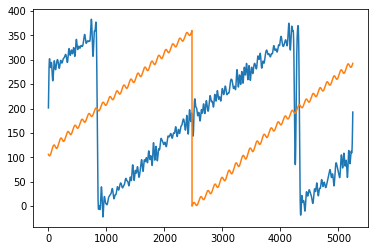

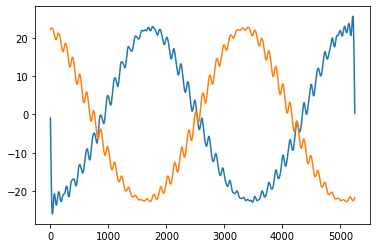

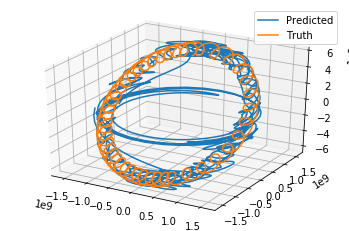

Top  100  Frequencies


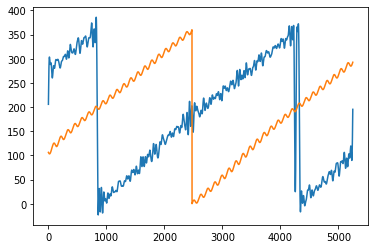

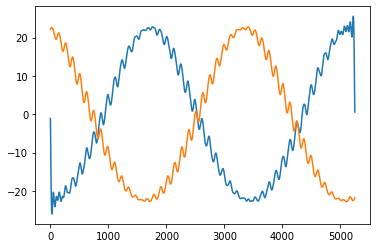

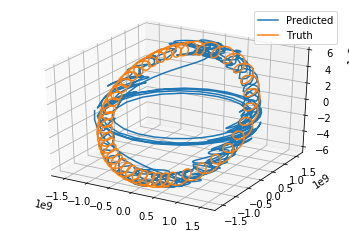

Top  300  Frequencies


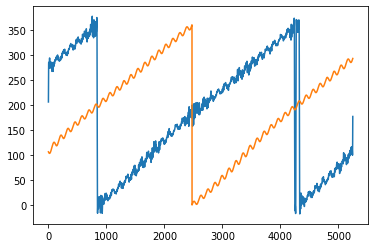

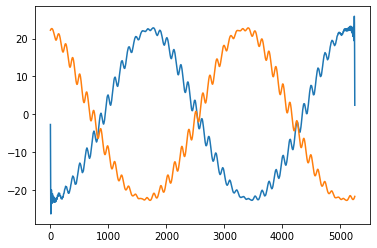

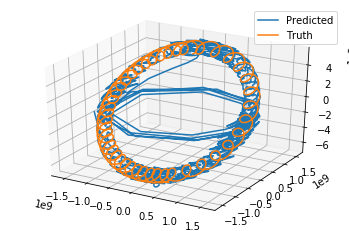

Top  1000  Frequencies


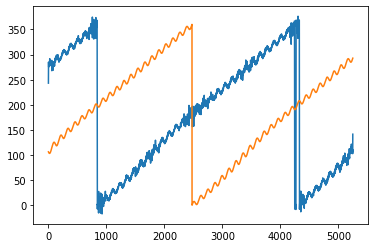

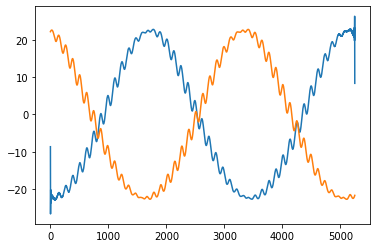

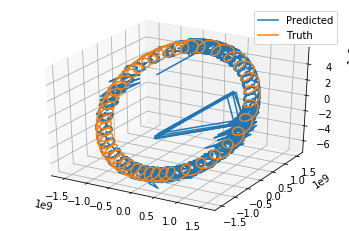

Top  5250  Frequencies


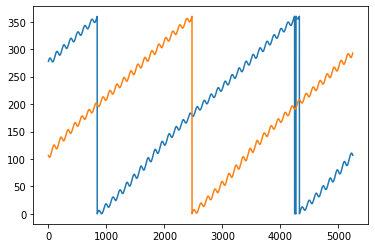

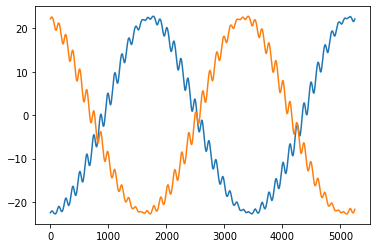

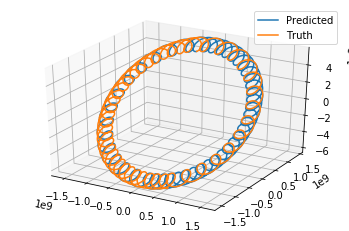

[2.04295598e+09 2.62847352e+09 2.73039236e+09 2.75395742e+09
 2.75453543e+09 2.76730269e+09 2.77937448e+09 2.78938398e+09
 2.80580118e+09 2.81474189e+09 2.83004919e+09 2.83534863e+09
 2.83710374e+09]
[100.05789629 168.37518807 173.76950774 175.79143065 176.29729251
 177.32910775 178.0864044  178.91271352 179.9170679  180.48568259
 181.38631279 181.70525277 181.806017  ]


array([ 95.98437702, 165.77393213, 171.06233311, 173.07562488,
       173.56224146, 174.58290131, 175.33721273, 176.15809048,
       177.16372688, 177.73242854, 178.62886535, 178.94765433,
       179.04834219])

In [28]:
length = saturn.shape[0]
asc_dec = np.asmatrix(saturn[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(saturn[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = saturn['Distance'][:(int(length/2))]
    dist_test = saturn['Distance'][(int(length/2)):]
    test_asc = saturn['Right Ascension'][(int(length/2)):]
    test_dec = saturn['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print(MSE_cartesian)
print(MSE)
one_norm

Jupiter

Top  1  Frequencies


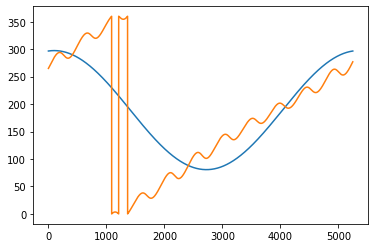

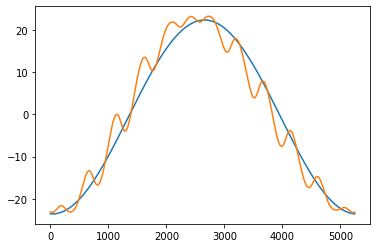

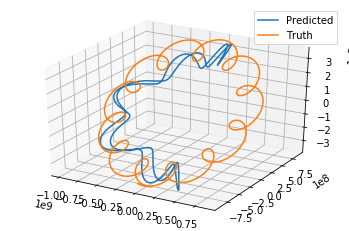

Top  5  Frequencies


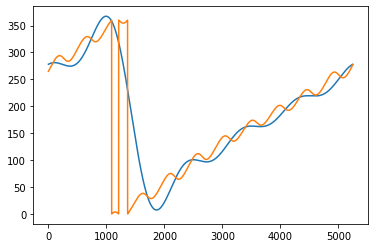

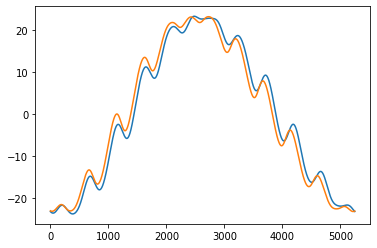

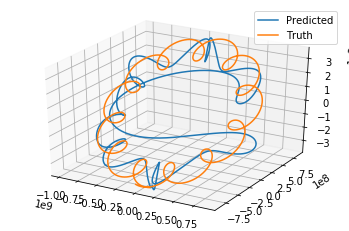

Top  10  Frequencies


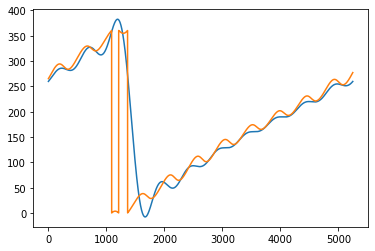

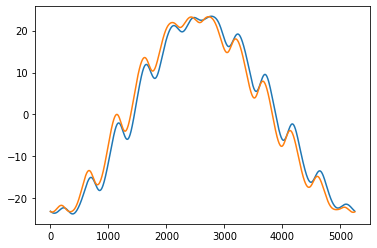

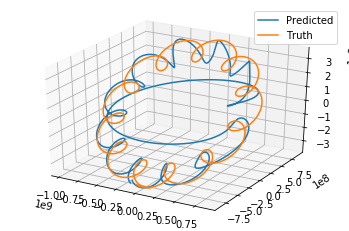

Top  15  Frequencies


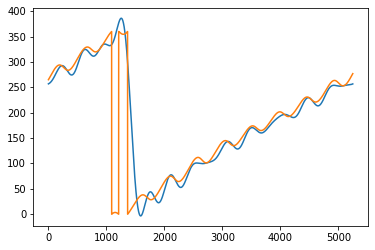

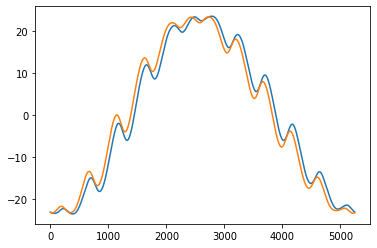

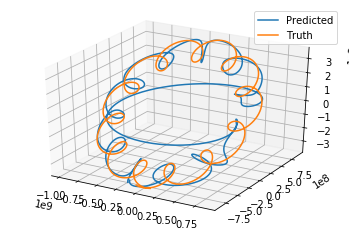

Top  20  Frequencies


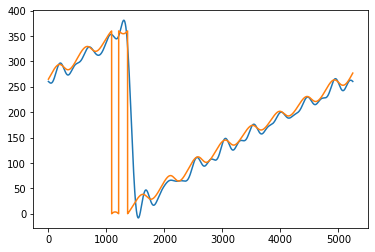

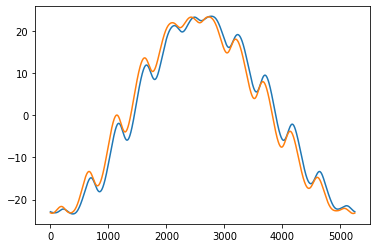

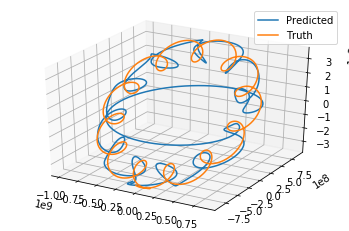

Top  30  Frequencies


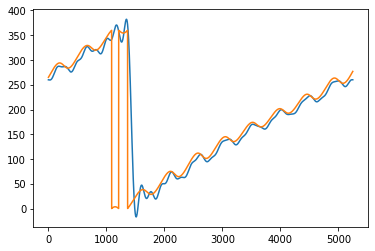

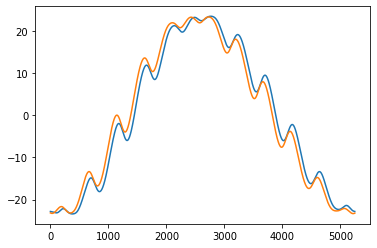

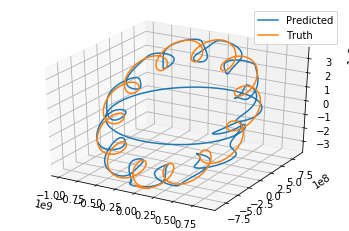

Top  40  Frequencies


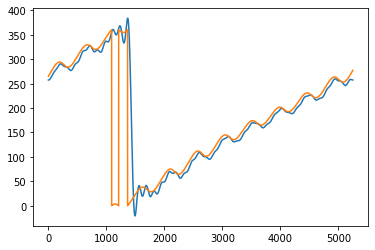

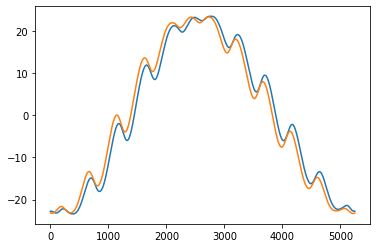

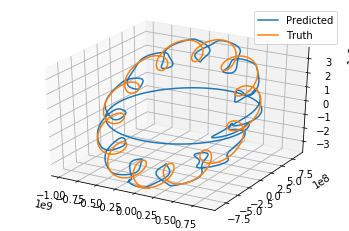

Top  50  Frequencies


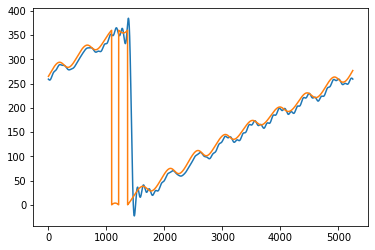

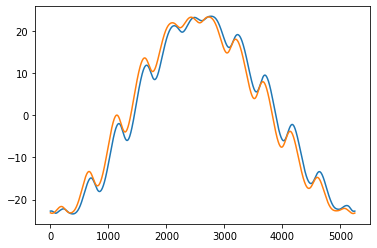

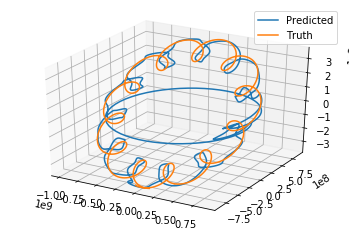

Top  75  Frequencies


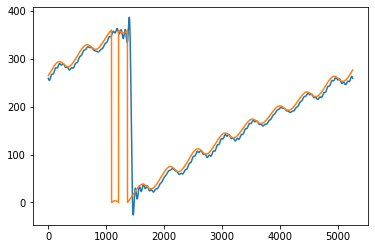

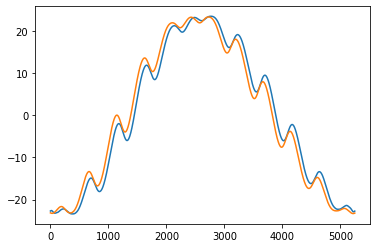

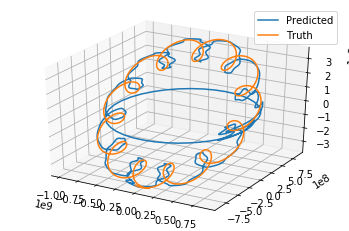

Top  100  Frequencies


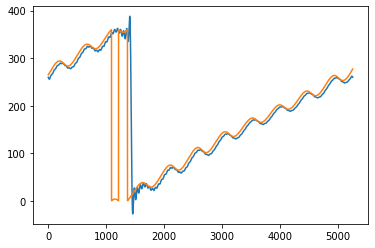

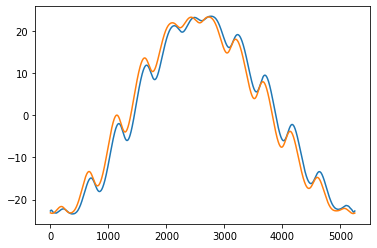

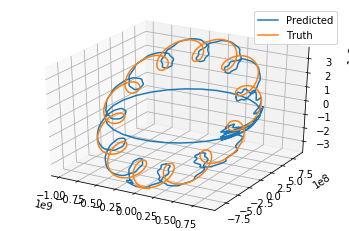

Top  300  Frequencies


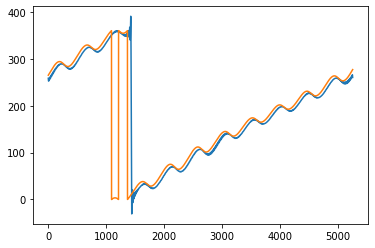

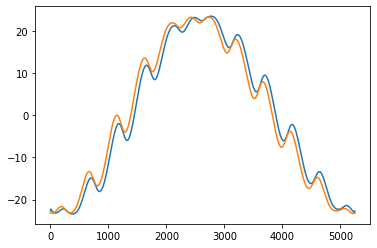

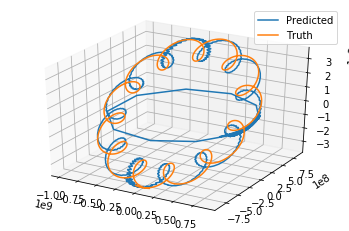

Top  1000  Frequencies


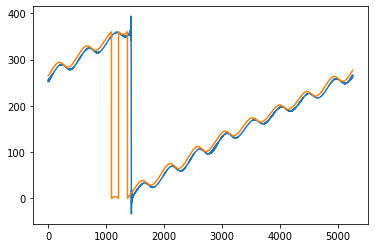

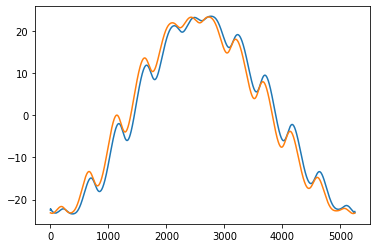

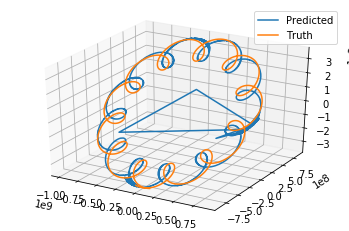

Top  5250  Frequencies


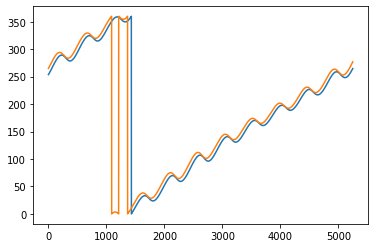

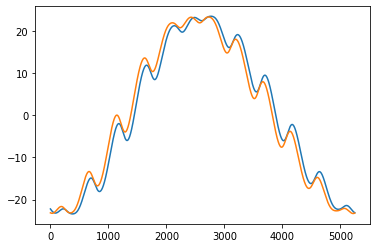

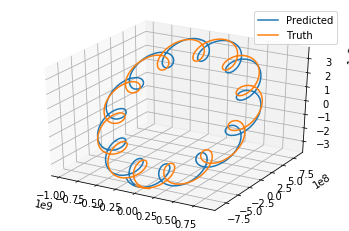

[5.67471941e+08 2.72863530e+08 1.80318067e+08 1.70597639e+08
 1.58021737e+08 1.44010388e+08 1.37366935e+08 1.33456355e+08
 1.27461601e+08 1.24510816e+08 1.18953706e+08 1.17162321e+08
 1.16427035e+08]
[51.06113416 29.06855079 22.69331029 21.1193016  20.25363417 20.3296026
 20.13488419 20.09148087 19.89347147 19.70520295 19.61153609 19.58282216
 19.57243283]


array([50.91659458, 28.90237716, 22.44859678, 20.87852084, 19.98368697,
       20.07122615, 19.88031423, 19.83012653, 19.63488781, 19.44427789,
       19.34761184, 19.31926334, 19.30890457])

In [29]:

length = jupiter.shape[0]
asc_dec = np.asmatrix(jupiter[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(jupiter[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = jupiter['Distance'][:(int(length/2))]
    dist_test = jupiter['Distance'][(int(length/2)):]
    test_asc = jupiter['Right Ascension'][(int(length/2)):]
    test_dec = jupiter['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print(MSE_cartesian)
print(MSE)
one_norm

Neptune

Top  1  Frequencies


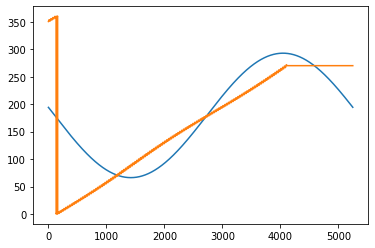

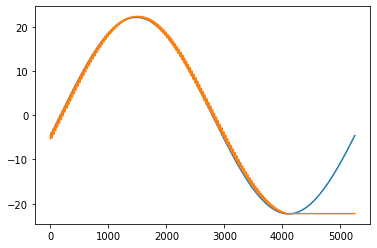

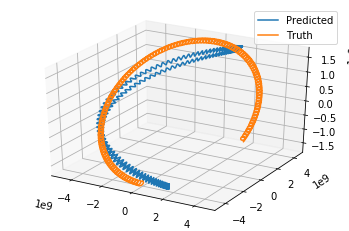

Top  5  Frequencies


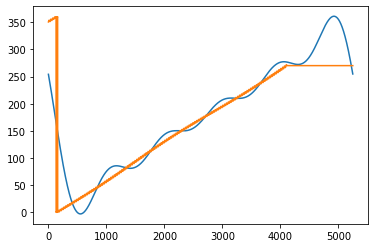

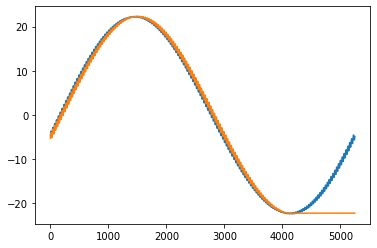

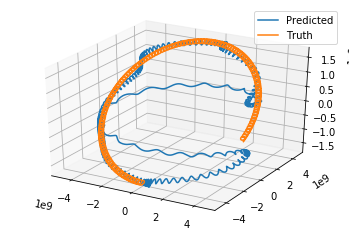

Top  10  Frequencies


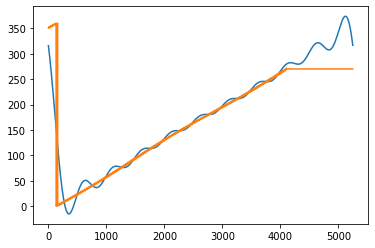

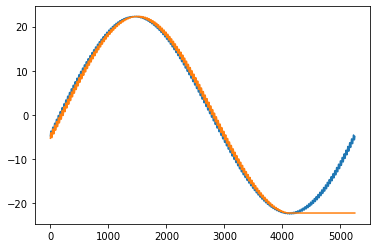

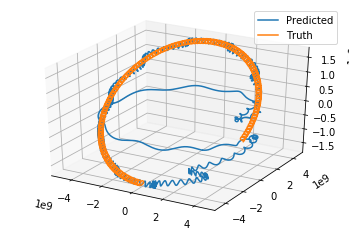

Top  15  Frequencies


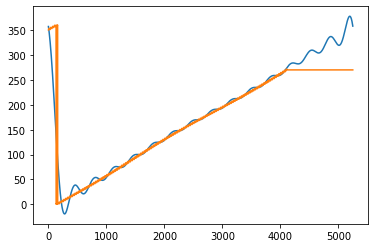

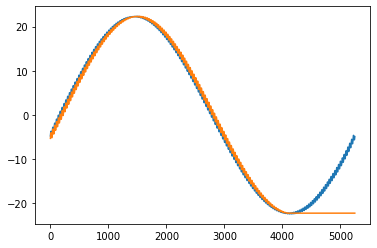

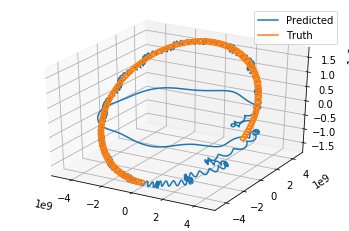

Top  20  Frequencies


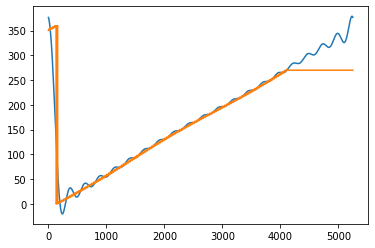

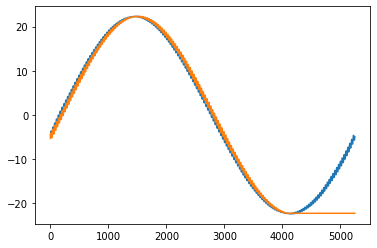

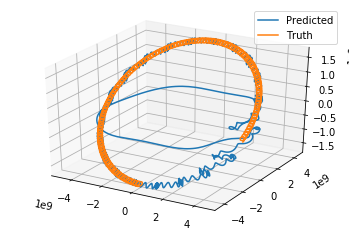

Top  30  Frequencies


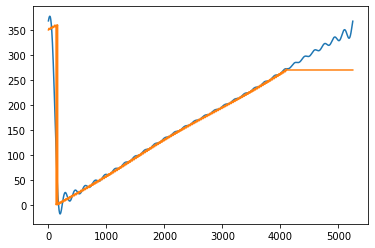

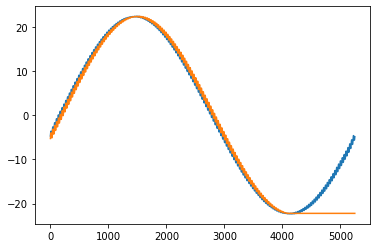

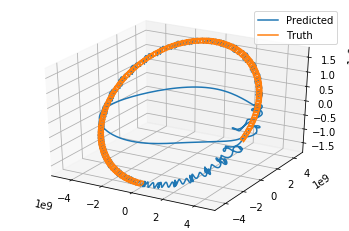

Top  40  Frequencies


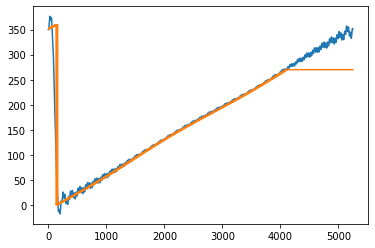

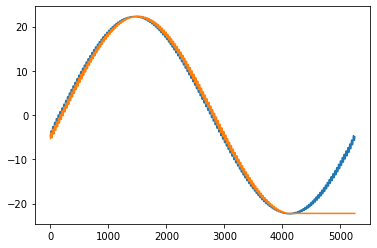

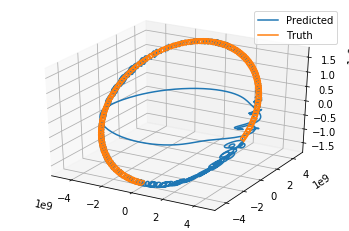

Top  50  Frequencies


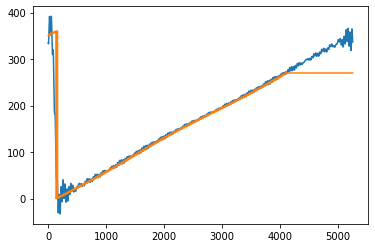

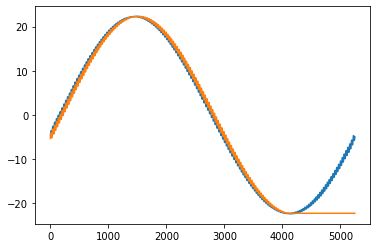

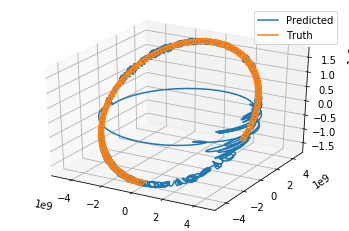

Top  75  Frequencies


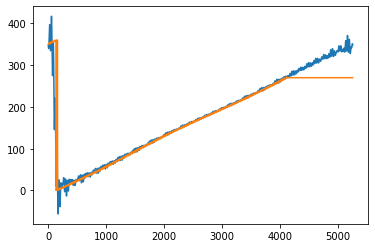

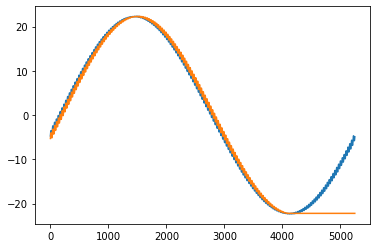

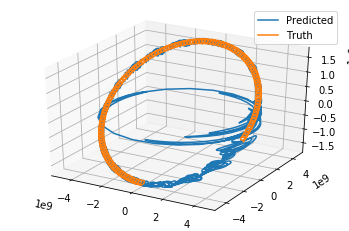

Top  100  Frequencies


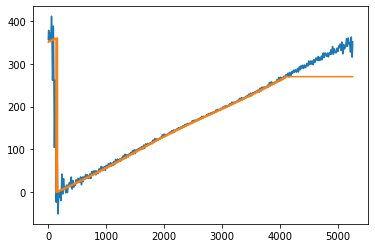

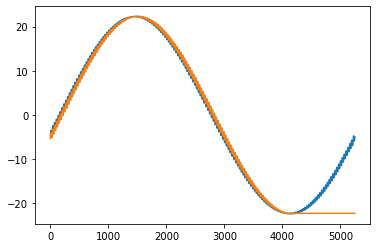

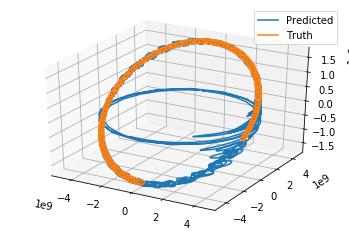

Top  300  Frequencies


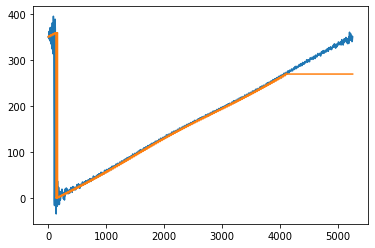

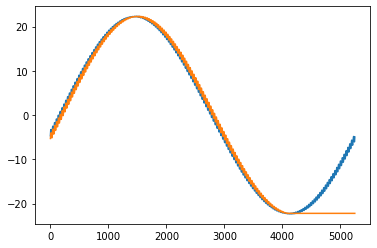

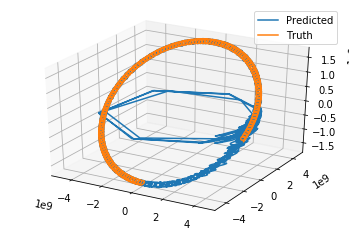

Top  1000  Frequencies


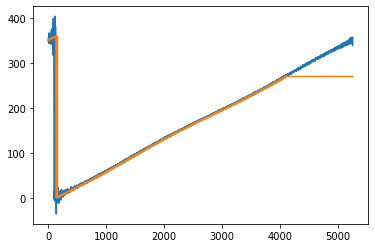

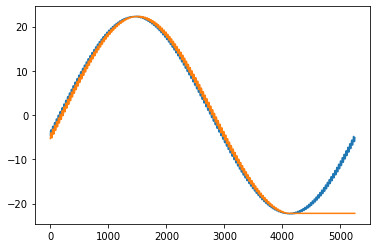

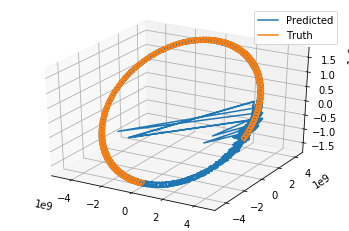

Top  5250  Frequencies


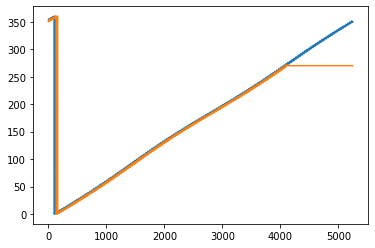

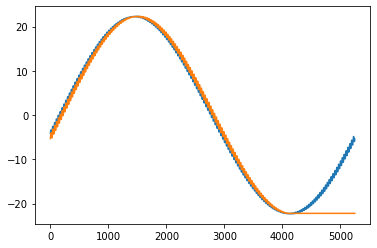

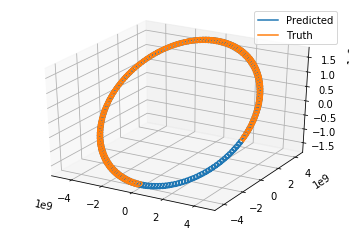

[2.82066181e+09 1.59912729e+09 1.30862745e+09 1.14773753e+09
 1.05671144e+09 9.62880328e+08 9.49450865e+08 9.71328040e+08
 9.76558031e+08 9.58486915e+08 8.46104788e+08 8.10857417e+08
 7.88495990e+08]
[41.8113211  23.37416044 19.0916303  16.81343018 15.54875176 14.32365596
 14.18686866 14.40917658 14.41747164 14.21651467 13.48289388 13.21707303
 12.99980236]


array([41.60847279, 23.21917794, 18.9531187 , 16.67272909, 15.39804675,
       14.1663916 , 14.02935682, 14.25333795, 14.26146784, 14.05892612,
       13.32191568, 13.05451723, 12.83590837])

In [30]:

length = Neptune.shape[0]
asc_dec = np.asmatrix(Neptune[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(Neptune[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = Neptune['Distance'][:(int(length/2))]
    dist_test = Neptune['Distance'][(int(length/2)):]
    test_asc = Neptune['Right Ascension'][(int(length/2)):]
    test_dec = Neptune['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

    
print(MSE_cartesian)
print(MSE)
one_norm

Pluto

Top  1  Frequencies


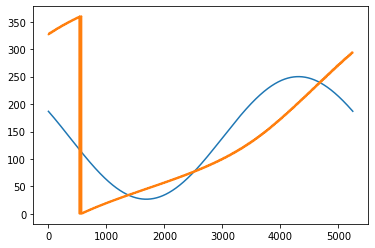

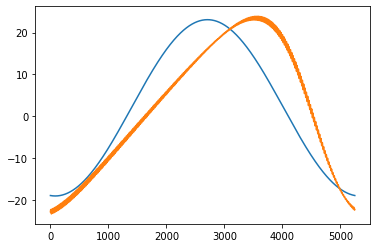

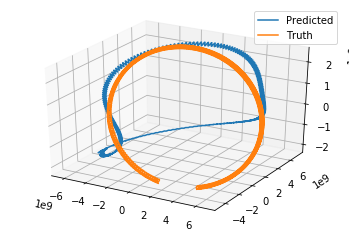

Top  5  Frequencies


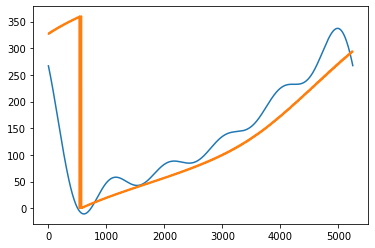

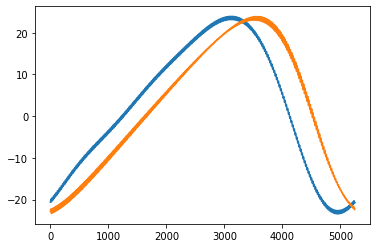

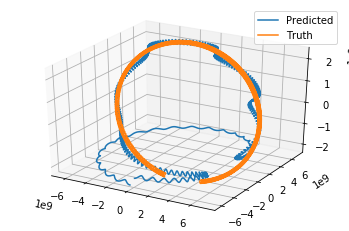

Top  10  Frequencies


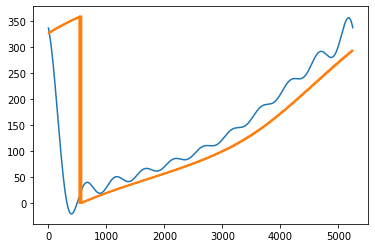

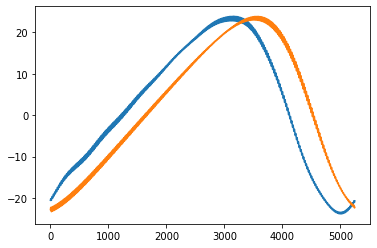

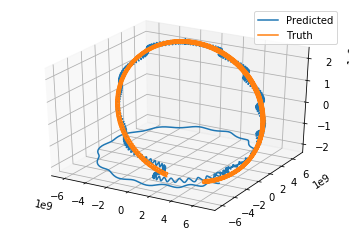

Top  15  Frequencies


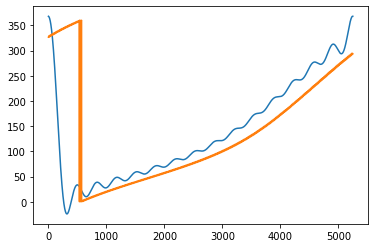

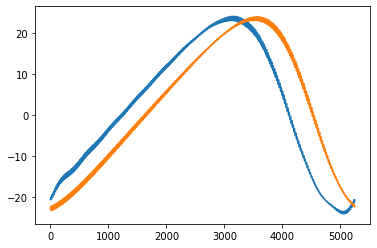

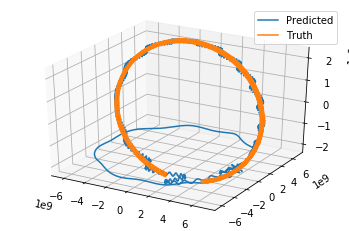

Top  20  Frequencies


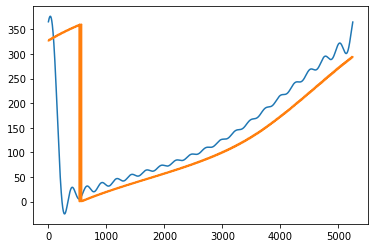

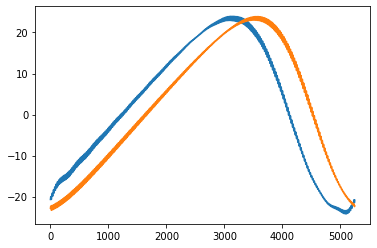

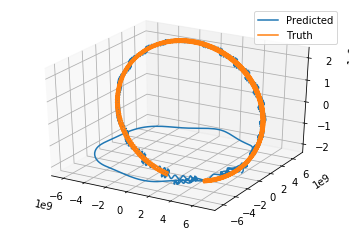

Top  30  Frequencies


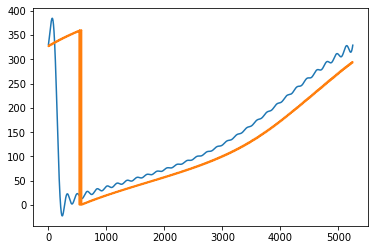

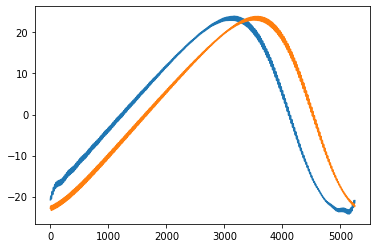

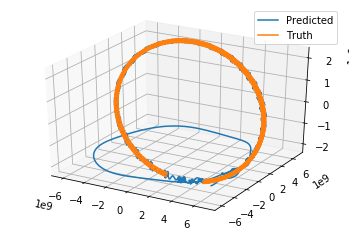

Top  40  Frequencies


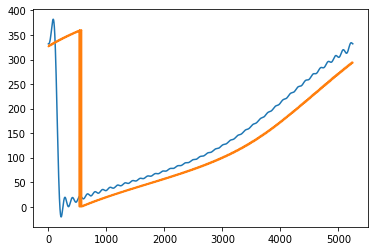

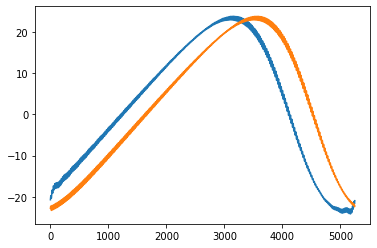

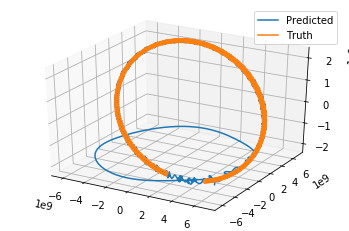

Top  50  Frequencies


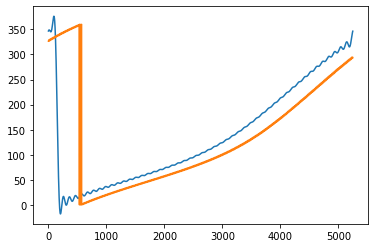

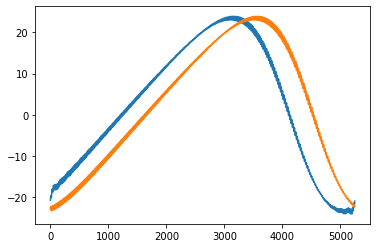

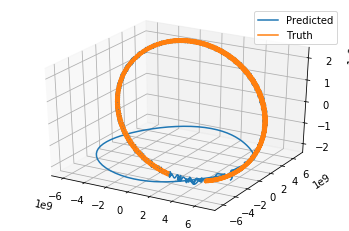

Top  75  Frequencies


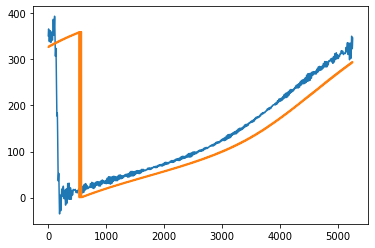

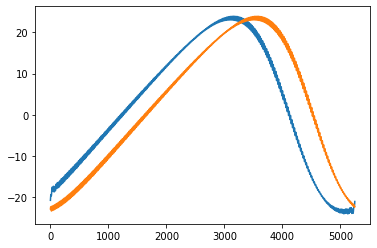

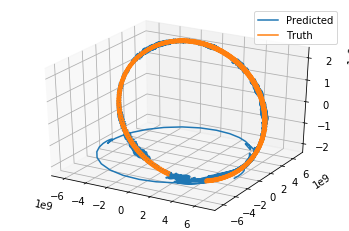

Top  100  Frequencies


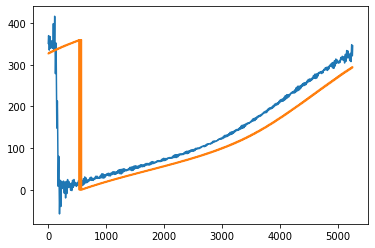

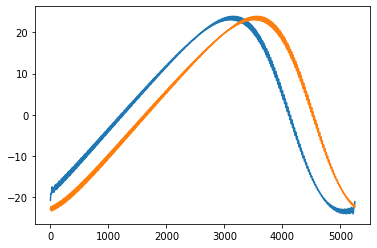

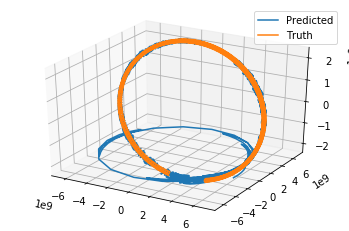

Top  300  Frequencies


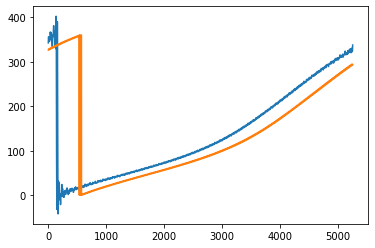

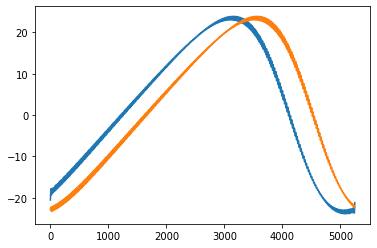

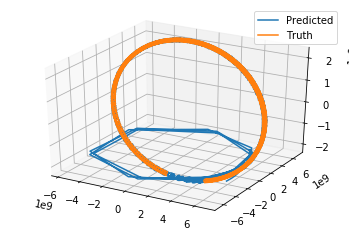

Top  1000  Frequencies


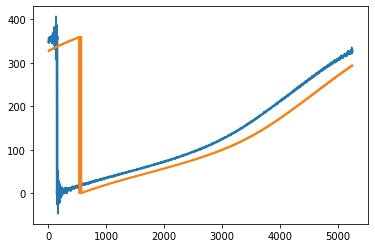

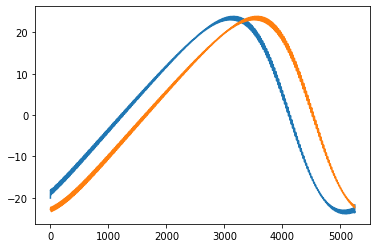

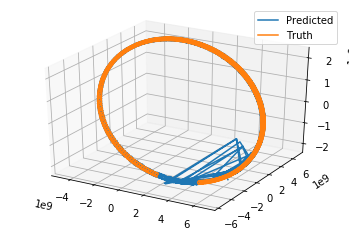

Top  5250  Frequencies


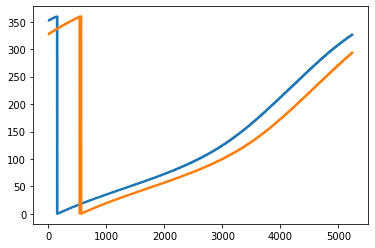

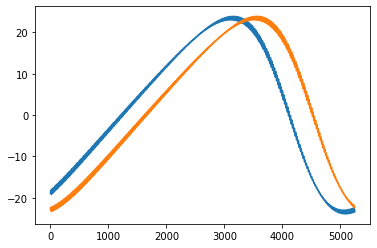

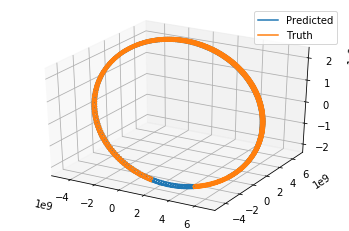

[4.74903517e+09 3.20563811e+09 2.92749730e+09 2.80797728e+09
 2.75397826e+09 2.70388132e+09 2.68046049e+09 2.66467274e+09
 2.66975292e+09 2.67703980e+09 2.62335997e+09 2.60670246e+09
 2.60003791e+09]
[58.16150864 50.99950715 52.34939991 51.30680457 51.54868603 51.45646964
 51.4600416  51.43585067 51.44684228 51.50833259 51.581773   51.5923492
 51.59050729]


array([57.1268959 , 49.88479788, 51.23279446, 50.18350288, 50.45420555,
       50.37496985, 50.37997883, 50.35892195, 50.35656756, 50.42410329,
       50.50471384, 50.51711764, 50.51587381])

In [31]:
length = Pluto.shape[0]
asc_dec = np.asmatrix(Pluto[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(Pluto[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = Pluto['Distance'][:(int(length/2))]
    dist_test = Pluto['Distance'][(int(length/2)):]
    test_asc = Pluto['Right Ascension'][(int(length/2)):]
    test_dec = Pluto['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print( MSE_cartesian)
print(MSE)
one_norm

Uranus

Top  1  Frequencies


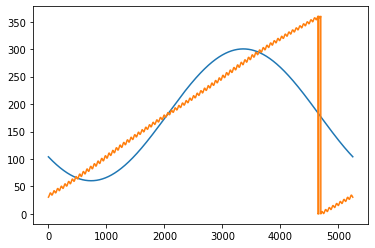

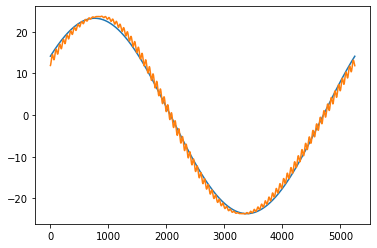

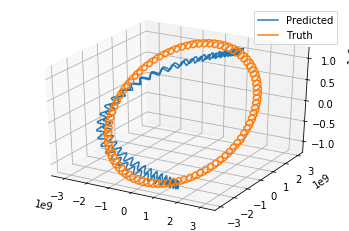

Top  5  Frequencies


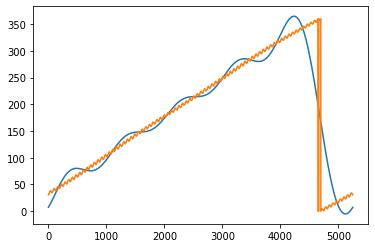

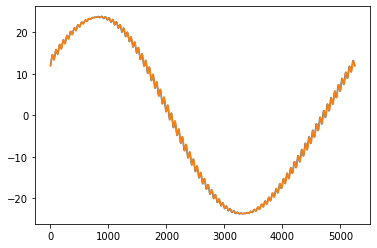

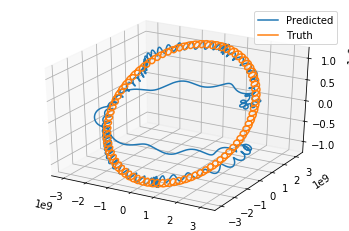

Top  10  Frequencies


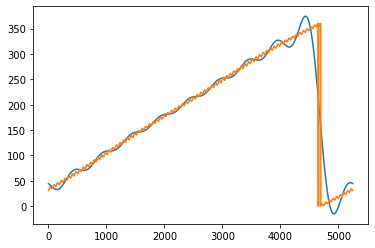

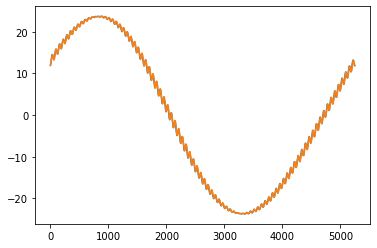

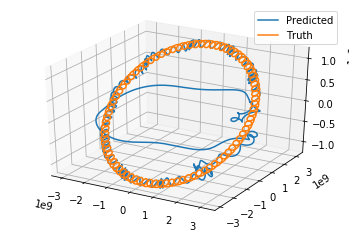

Top  15  Frequencies


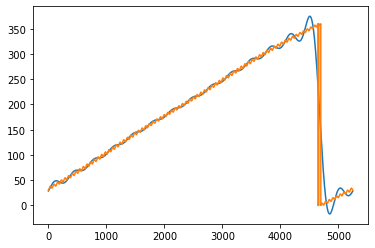

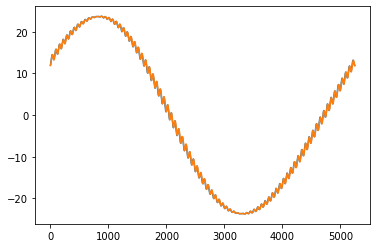

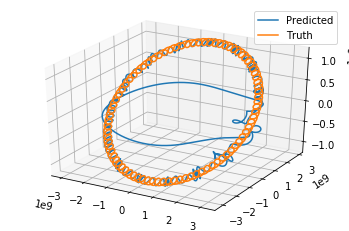

Top  20  Frequencies


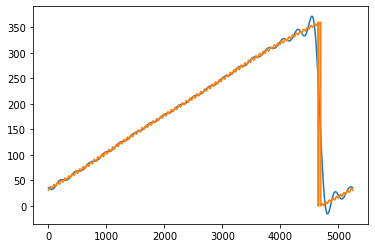

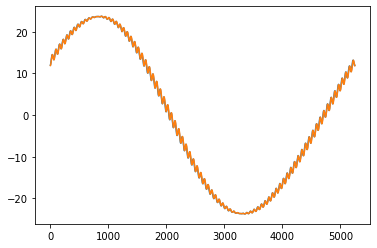

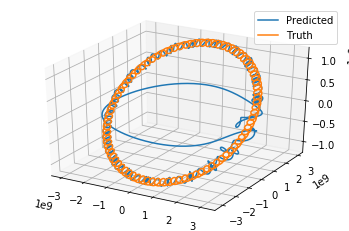

Top  30  Frequencies


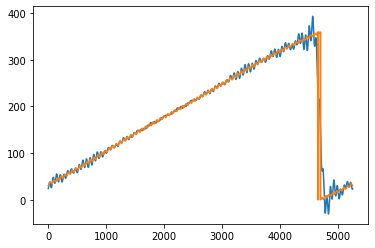

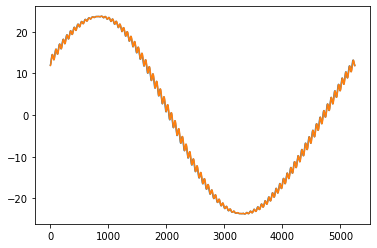

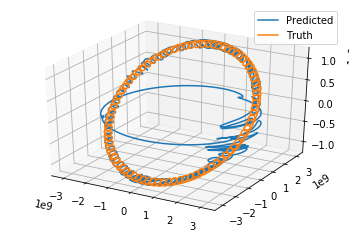

Top  40  Frequencies


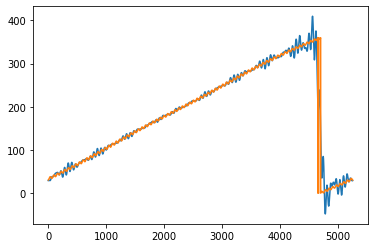

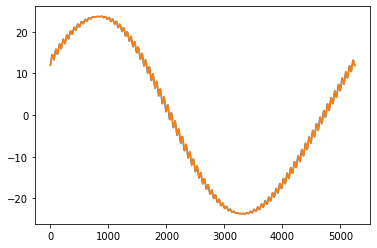

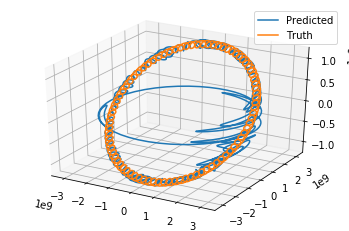

Top  50  Frequencies


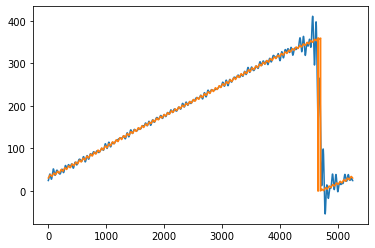

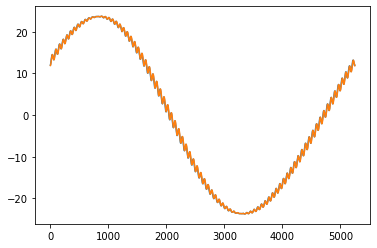

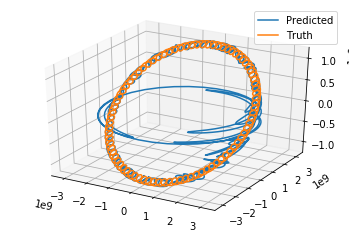

Top  75  Frequencies


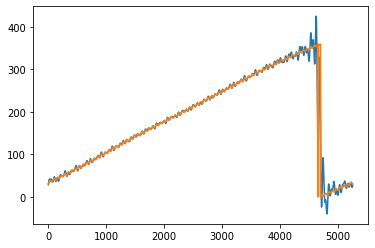

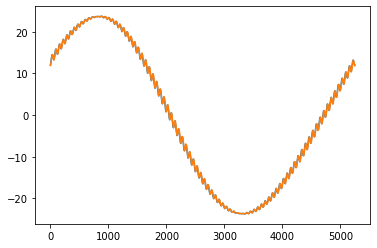

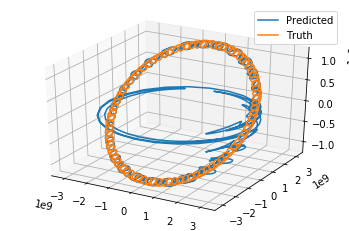

Top  100  Frequencies


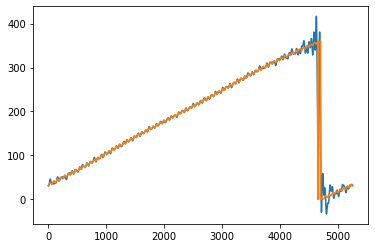

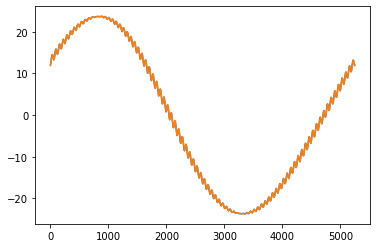

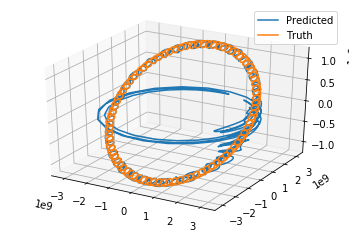

Top  300  Frequencies


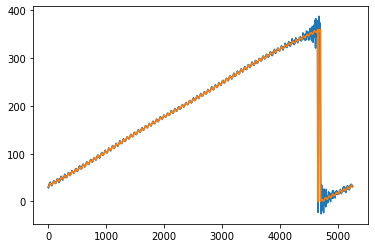

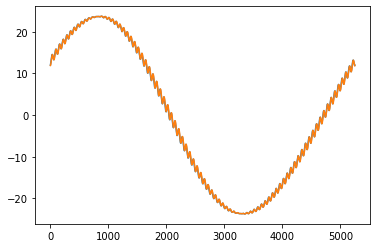

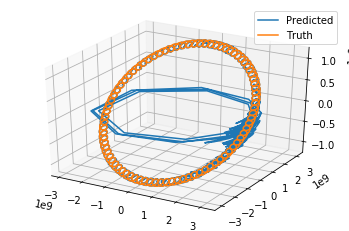

Top  1000  Frequencies


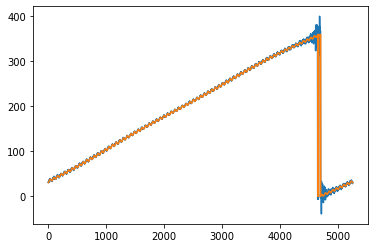

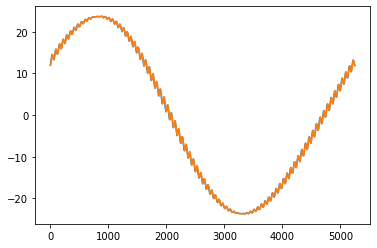

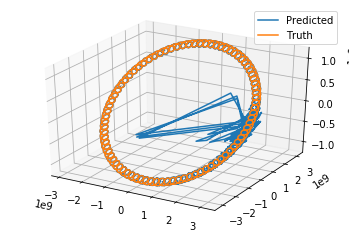

Top  5250  Frequencies


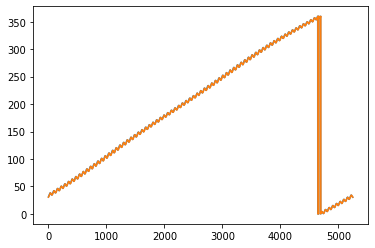

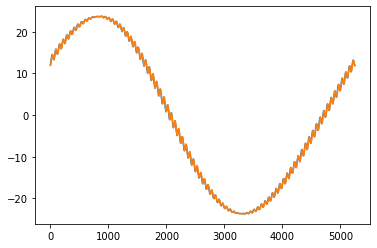

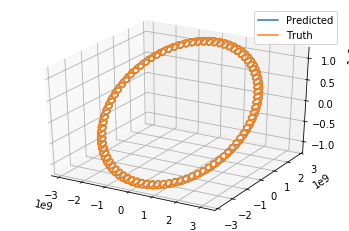

[2.12089046e+09 8.49106207e+08 5.12271964e+08 3.67422930e+08
 2.88610489e+08 3.27174262e+08 3.35143660e+08 2.98856536e+08
 2.61255345e+08 2.08773455e+08 1.04383286e+08 7.65831316e+07
 4.88196783e+07]
[49.09662775 18.69256823 11.24125002  8.16518672  6.57610144  7.16768396
  7.16358152  6.29695613  5.41646056  4.27576246  2.12980171  1.78277201
  1.27694123]


array([49.07463823, 18.68861524, 11.23450571,  8.15484699,  6.56368265,
        7.15674005,  7.15292939,  6.28397567,  5.40341424,  4.25947278,
        2.10635932,  1.75958461,  1.25035898])

In [32]:

length = Uranus.shape[0]
asc_dec = np.asmatrix(Uranus[['Right Ascension','Declination']])[:(int(length/2)),: ]
asc_dec_test = np.asmatrix(Uranus[['Right Ascension','Declination']])[(int(length/2)):,: ]

#number of top frequencies
k = [1,5,10,15,20,30,40,50,75,100,300,1000,int(length/2)]

MSE_cartesian = np.zeros((len(k)))
MSE = np.zeros((len(k)))
one_norm = np.zeros((len(k)))

for i in range(0,len(k)):
   
    #forecasting throught the trainig set and into the test set. I will only keep the test forecasts.
    preds_asc = fourier_forecast(asc_dec[:,0],length,k[i],plot = False)[(int(length/2)):,]
    preds_dec = fourier_forecast(asc_dec[:,1],length,k[i],plot = False)[(int(length/2)):,]
    print('Top ',k[i],' Frequencies')
    plt.plot(preds_asc)
    plt.plot(asc_dec_test[:,0])
    plt.show()
    plt.plot(preds_dec)
    plt.plot(asc_dec_test[:,1])
    plt.show()
    
    #plot data on the cartersian coordinates
    dist_train = Uranus['Distance'][:(int(length/2))]
    dist_test = Uranus['Distance'][(int(length/2)):]
    test_asc = Uranus['Right Ascension'][(int(length/2)):]
    test_dec = Uranus['Declination'][(int(length/2)):]
    x1, y1, z1 = convert_cartesian(np.radians(preds_asc), np.radians(preds_dec), dist_train)
    x2, y2, z2 = convert_cartesian(np.radians(test_asc), np.radians(test_dec), dist_test)

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.plot(x1, y1, z1)
    ax.plot(x2, y2, z2)
    plt.legend(['Predicted', 'Truth'])
    plt.show()
    
    
    #erros of cartesian coordinates
    preds = np.column_stack((preds_asc,preds_dec))
    preds_cartesian = np.column_stack((x1,y1,z1))
    actual_cartesian = np.column_stack((x2,y2,z2))
    MSE_cartesian[i] = np.mean(np.array([np.linalg.norm((preds_cartesian - actual_cartesian)[i,:]) for i in range(0,preds.shape[0])]))
    #errors in ascention and declination
    preds = np.column_stack((preds_asc,preds_dec))
    one_norm[i]= np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:],ord=1) for i in range(0,preds.shape[0])]))
    MSE[i] = np.mean(np.array([np.linalg.norm((preds - asc_dec_test)[i,:]) for i in range(0,preds.shape[0])]))

print(MSE_cartesian)
print(MSE)
one_norm